In [67]:
from __future__ import print_function
import numpy as np # Biblioteca de funciones matematicas de alto nivel
np.random.seed(1337)  # for reproducibility
#import tensorflow as tf
#import keras  
import pandas as pd

In [68]:
dataset = pd.read_csv('train.csv', encoding = "ISO-8859-1") # lectura de datos
dataset1 = pd.read_csv('test.csv', encoding = "ISO-8859-1") # lectura de datos
dataset2 = pd.read_csv('validation.csv', encoding = "ISO-8859-1") # lectura de datos

In [69]:
#Extra check, but we drop inf and nan after 

dataset.replace([np.inf, -np.inf], -1, inplace=True) 
dataset.replace([np.nan, -np.nan], -1, inplace=True)

dataset1.replace([np.inf, -np.inf], -1, inplace=True) 
dataset1.replace([np.nan, -np.nan], -1, inplace=True)

dataset2.replace([np.inf, -np.inf], -1, inplace=True) 
dataset2.replace([np.nan, -np.nan], -1, inplace=True)

In [70]:
# Convert numeric dataset columns to Float

numeric_columns = dataset.select_dtypes(include=['int64', 'float64']).columns
for column in numeric_columns:
    dataset[column] = dataset[column].astype(float)

numeric_columns1 = dataset1.select_dtypes(include=['int64', 'float64']).columns
for column in numeric_columns1:
    dataset1[column] = dataset1[column].astype(float)

numeric_columns1 = dataset2.select_dtypes(include=['int64', 'float64']).columns
for column in numeric_columns1:
    dataset2[column] = dataset2[column].astype(float)

In [71]:
# Eliminar espacios en blanco de los nombres de las columnas
dataset.columns = dataset.columns.str.strip()
dataset1.columns = dataset1.columns.str.strip()
dataset2.columns = dataset2.columns.str.strip()

# Convertir los nombres de las columnas a minúsculas
#dataset.columns = dataset.columns.str.lower()
#dataset1.columns = dataset1.columns.str.lower()
#dataset2.columns = dataset2.columns.str.lower()

# Usar el nombre de la columna correcto
Labels = dataset['Label'].unique()
Y_train = dataset["Label"]
Y_test = dataset1["Label"]
Y_validation = dataset2["Label"]

Bwd PSH Flags
Fwd URG Flags
Bwd URG Flags
FIN Flag Count
PSH Flag Count
ECE Flag Count
Fwd Avg Bytes/Bulk
Fwd Avg Packets/Bulk
Fwd Avg Bulk Rate
Bwd Avg Bytes/Bulk
Bwd Avg Packets/Bulk
Bwd Avg Bulk Rate


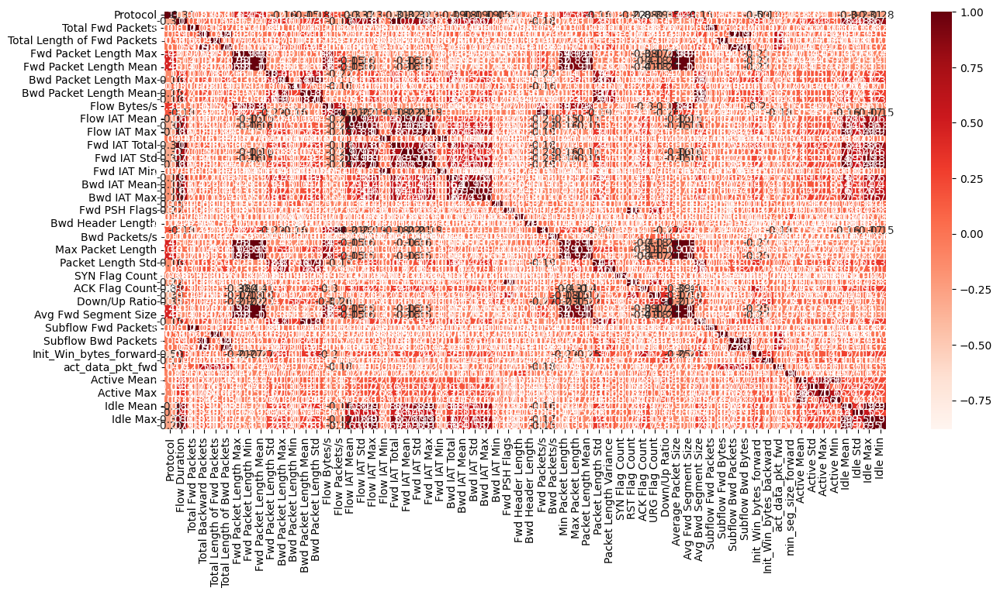

Dimensiones originales:
X_train original: (1354553, 64)
X_test original: (580523, 64)
X_validation original: (290262, 64)

Columnas con varianza cero eliminadas:
Número de columnas eliminadas: 0
Columnas eliminadas: []

Nombres de columnas en X_train:
Columnas en X_train: ['Protocol', 'Flow Duration', 'Total Fwd Packets', 'Total Backward Packets', 'Total Length of Fwd Packets', 'Total Length of Bwd Packets', 'Fwd Packet Length Max', 'Fwd Packet Length Min', 'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max', 'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s', 'Min Packet Length', 'Max Packet Lengt

<Figure size 1500x800 with 0 Axes>

In [72]:
from sklearn.feature_selection import VarianceThreshold
import seaborn as sns
import matplotlib.pyplot as plt

X_train=dataset.iloc[:, 0:76] #Luego obtenemos las características del flujo
X_test=dataset1.iloc[:, 0:76]
X_validation=dataset2.iloc[:, 0:76]

sel = VarianceThreshold(threshold=0)
#hola=sel.fit_transform(X_train)

aux=X_train.var()

for col in X_train.columns:
    if X_train[col].var() == 0:
        print(col)
        X_train = X_train.drop(col, axis=1)
        X_test = X_test.drop(col, axis=1)
        X_validation=X_validation.drop(col, axis=1)
        #Aqui iria un drop

plt.figure(figsize=(15, 7))
cor = X_train.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

features = list(X_train.columns)

plt.savefig('line_plot.svg') 
#pintar solo con colores


# 1. Verificar dimensiones originales
print("Dimensiones originales:")
print(f"X_train original: {X_train.shape}")
print(f"X_test original: {X_test.shape}")
print(f"X_validation original: {X_validation.shape}")

# 2. Verificar columnas eliminadas por varianza cero
zero_var_cols = [col for col in X_train.columns if X_train[col].var() == 0]
print("\nColumnas con varianza cero eliminadas:")
print(f"Número de columnas eliminadas: {len(zero_var_cols)}")
print("Columnas eliminadas:", zero_var_cols)

# 4. Verificar que las columnas coincidan entre los conjuntos
print("\nNombres de columnas en X_train:")
if isinstance(X_train, pd.DataFrame):
    print(f"Columnas en X_train: {list(X_train.columns)}")
    print(f"Número total de columnas: {len(X_train.columns)}")

In [73]:
# Convertir las etiquetas de texto a números
Y_train_numeric = pd.get_dummies(Y_train).idxmax(axis=1)

# Obtener los nombres de las etiquetas
label_names = Y_train.unique()


In [74]:
Y_train
unique, counts = np.unique(Y_train, return_counts=True)
counts

array([79775, 79460, 79834, 79697, 79602, 79548, 79830, 79755, 79773,
       79828, 79498, 79678, 79463, 79734, 79732, 79745, 79601],
      dtype=int64)

In [75]:
unique

array(['BENIGN', 'DrDoS_DNS', 'DrDoS_LDAP', 'DrDoS_MSSQL', 'DrDoS_NTP',
       'DrDoS_NetBIOS', 'DrDoS_SNMP', 'DrDoS_SSDP', 'DrDoS_UDP', 'LDAP',
       'MSSQL', 'NetBIOS', 'Portmap', 'Syn', 'TFTP', 'UDP', 'UDPLag'],
      dtype=object)

In [76]:
from sklearn.preprocessing import LabelEncoder

lb_make = LabelEncoder()
Y_test = lb_make.fit_transform(Y_test)

Labels1 = lb_make.inverse_transform(Y_test)
Labels1 = list(lb_make.classes_)
Labels1
unique1, counts1 = np.unique(Y_train, return_counts=True)
unique1


array(['BENIGN', 'DrDoS_DNS', 'DrDoS_LDAP', 'DrDoS_MSSQL', 'DrDoS_NTP',
       'DrDoS_NetBIOS', 'DrDoS_SNMP', 'DrDoS_SSDP', 'DrDoS_UDP', 'LDAP',
       'MSSQL', 'NetBIOS', 'Portmap', 'Syn', 'TFTP', 'UDP', 'UDPLag'],
      dtype=object)

In [77]:
dataset["Label"].value_counts()

Label
DrDoS_LDAP       79834
DrDoS_SNMP       79830
LDAP             79828
BENIGN           79775
DrDoS_UDP        79773
DrDoS_SSDP       79755
UDP              79745
Syn              79734
TFTP             79732
DrDoS_MSSQL      79697
NetBIOS          79678
DrDoS_NTP        79602
UDPLag           79601
DrDoS_NetBIOS    79548
MSSQL            79498
Portmap          79463
DrDoS_DNS        79460
Name: count, dtype: int64

In [78]:
unique, counts = np.unique(Y_test, return_counts=True)
counts

array([34053, 34368, 33994, 34131, 34226, 34280, 33998, 34073, 34055,
       34000, 34330, 34150, 34365, 34094, 34096, 34083, 34227],
      dtype=int64)

In [79]:
dataset1["Label"].value_counts()

Label
DrDoS_DNS        34368
Portmap          34365
MSSQL            34330
DrDoS_NetBIOS    34280
UDPLag           34227
DrDoS_NTP        34226
NetBIOS          34150
DrDoS_MSSQL      34131
TFTP             34096
Syn              34094
UDP              34083
DrDoS_SSDP       34073
DrDoS_UDP        34055
BENIGN           34053
LDAP             34000
DrDoS_SNMP       33998
DrDoS_LDAP       33994
Name: count, dtype: int64

In [80]:
import shap

from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline

from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import make_pipeline

#scaler = MinMaxScaler().fit(X_train) # Normalizamos los datos
#trainX = scaler.transform(X_train) # Asi se representan los datos

#testT = scaler.transform(X_test)
#OF 1200 to 2000
model = make_pipeline(
    StandardScaler(),
    MLPClassifier(hidden_layer_sizes=(16,12),activation='relu', max_iter=1200,random_state=0)
)

In [81]:
X_trainArr=X_train.to_numpy()
Y_train
print("Shape of Y_train:", Y_train.shape)

# Entrenar el modelo y guardar el historial
#history = model.fit(X_trainArr,Y_train)
"""
#Descomentar para calcular train loss y train accuracy

# Obtener el clasificador del pipeline
mlp = model.named_steps['mlpclassifier']

# Inicializar listas para guardar precisión y pérdida en cada época
train_loss = []
train_accuracy = []
val_loss = []
val_accuracy = []

# Iterar sobre las épocas del historial del modelo
for epoch in range(len(mlp.loss_curve_)):
    # Obtener pérdida de entrenamiento
    train_loss.append(mlp.loss_curve_[epoch])
    
    # Obtener precisión de entrenamiento
    train_preds = mlp.predict(X_train)
    train_accuracy.append(np.mean(train_preds == Y_train))
    
    # Obtener precisión y pérdida de validación si está disponible
    val_preds = mlp.predict(X_validation)
    val_accuracy.append(np.mean(val_preds == Y_validation))
    
    # No podemos obtener la pérdida de validación directamente, así que añadimos un valor NaN
    val_loss.append(np.nan)

# Crear la figura y los ejes
fig, ax1 = plt.subplots(figsize=(12, 6))

# Graficar precisión (accuracy) en el eje y1
color = 'tab:blue'
ax1.set_xlabel('Épocas')
ax1.set_ylabel('Precisión', color=color)
ax1.plot(train_accuracy, label='Precisión de entrenamiento', color=color)
ax1.plot(val_accuracy, label='Precisión de validación', color='tab:cyan')
ax1.tick_params(axis='y', labelcolor=color)

# Crear un segundo eje y para la pérdida (loss) compartiendo el mismo eje x
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Pérdida', color=color)
ax2.plot(train_loss, label='Pérdida de entrenamiento', color=color)
# Agregamos la línea de val_loss solo si existe algún valor distinto de None
if any(val_loss):
    ax2.plot(val_loss, label='Pérdida de validación', color='tab:orange')
ax2.tick_params(axis='y', labelcolor=color)

# Añadir leyendas
fig.tight_layout()  # Para ajustar el layout y que no se solapen etiquetas
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title('Precisión y Pérdida durante el Entrenamiento')
plt.show()

# Evaluar el modelo en los datos de prueba
test_score = model.score(X_test, Y_test)
print("Precisión en el conjunto de prueba:", test_score)

# Evaluar el modelo en los datos de validación
validation_score = model.score(X_validation, Y_validation)
print("Precisión en el conjunto de validación:", validation_score)
"""


Shape of Y_train: (1354553,)


'\n#Descomentar para calcular train loss y train accuracy\n\n# Obtener el clasificador del pipeline\nmlp = model.named_steps[\'mlpclassifier\']\n\n# Inicializar listas para guardar precisión y pérdida en cada época\ntrain_loss = []\ntrain_accuracy = []\nval_loss = []\nval_accuracy = []\n\n# Iterar sobre las épocas del historial del modelo\nfor epoch in range(len(mlp.loss_curve_)):\n    # Obtener pérdida de entrenamiento\n    train_loss.append(mlp.loss_curve_[epoch])\n    \n    # Obtener precisión de entrenamiento\n    train_preds = mlp.predict(X_train)\n    train_accuracy.append(np.mean(train_preds == Y_train))\n    \n    # Obtener precisión y pérdida de validación si está disponible\n    val_preds = mlp.predict(X_validation)\n    val_accuracy.append(np.mean(val_preds == Y_validation))\n    \n    # No podemos obtener la pérdida de validación directamente, así que añadimos un valor NaN\n    val_loss.append(np.nan)\n\n# Crear la figura y los ejes\nfig, ax1 = plt.subplots(figsize=(12, 6))

In [82]:
"""
import torch
import torch.nn as nn
import torch.optim as optim

# Define the model class
class M(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear = nn.Linear(5, 10)
        self.linear2 = nn.Linear(10, 1)  # Add another layer

    def forward(self, x):
        return self.linear(x)
        return self.linear2(x)
    
# Define the quantization function
def quantize_model(model):
    model.qconfig = torch.ao.quantization.get_default_qconfig('fbgemm')
    torch.quantization.prepare_qat(model, inplace=True)
    # Calibrate the model
    input_fp32 = torch.randn(4, 5)
    model(input_fp32)
    torch.quantization.convert(model, inplace=True)
    return model
    """

"\nimport torch\nimport torch.nn as nn\nimport torch.optim as optim\n\n# Define the model class\nclass M(nn.Module):\n    def __init__(self):\n        super().__init__()\n        self.linear = nn.Linear(5, 10)\n        self.linear2 = nn.Linear(10, 1)  # Add another layer\n\n    def forward(self, x):\n        return self.linear(x)\n        return self.linear2(x)\n    \n# Define the quantization function\ndef quantize_model(model):\n    model.qconfig = torch.ao.quantization.get_default_qconfig('fbgemm')\n    torch.quantization.prepare_qat(model, inplace=True)\n    # Calibrate the model\n    input_fp32 = torch.randn(4, 5)\n    model(input_fp32)\n    torch.quantization.convert(model, inplace=True)\n    return model\n    "

In [83]:
"""
# Optionally, define the training loop
def train_model(model, input_fp32):
    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01)

    for epoch in range(10):
        optimizer.zero_grad()
        outputs = model(input_fp32)
        loss = criterion(outputs, torch.randn(4, 10))
        loss.backward()
        optimizer.step()
        print(f'Epoch {epoch+1}, Loss: {loss.item()}')
"""

"\n# Optionally, define the training loop\ndef train_model(model, input_fp32):\n    criterion = nn.MSELoss()\n    optimizer = optim.SGD(model.parameters(), lr=0.01)\n\n    for epoch in range(10):\n        optimizer.zero_grad()\n        outputs = model(input_fp32)\n        loss = criterion(outputs, torch.randn(4, 10))\n        loss.backward()\n        optimizer.step()\n        print(f'Epoch {epoch+1}, Loss: {loss.item()}')\n"

In [84]:
"""
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import copy  # Add this line to import the copy module

# Convert data to numpy arrays if not already
X_trainArr = X_train.to_numpy()
X_trainArr = X_trainArr.astype(np.float64)

# Define the model class
class M(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear = nn.Linear(5, 10)
        self.linear2 = nn.Linear(10, 1)  # Add another layer to ensure parameters exist

    def forward(self, x):
        x = self.linear(x)
        return self.linear2(x)

def quantize_model(model):
    model_copy = copy.deepcopy(model)
    model_copy.qconfig = torch.ao.quantization.get_default_qconfig('fbgemm')
    torch.quantization.prepare_qat(model_copy, inplace=True)
    # Calibrate the model
    input_fp32 = torch.randn(4, 5)
    model_copy(input_fp32)
    torch.quantization.convert(model_copy, inplace=True)
    return model_copy

def train_model(model, input_fp32, num_epochs=10, lr=0.01):
    # Ensure the model has trainable parameters
    if len(list(model.parameters())) == 0:
        raise ValueError("Model has no trainable parameters.")

    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=lr)

    for epoch in range(num_epochs):
        optimizer.zero_grad()
        outputs = model(input_fp32)
        loss = criterion(outputs, torch.ones_like(outputs))  # Assuming a simple regression task
        loss.backward()
        optimizer.step()

        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

    return model
"""


'\nimport torch\nimport torch.nn as nn\nimport torch.optim as optim\nfrom sklearn.metrics import confusion_matrix\nimport matplotlib.pyplot as plt\nimport numpy as np\nimport seaborn as sns\nimport copy  # Add this line to import the copy module\n\n# Convert data to numpy arrays if not already\nX_trainArr = X_train.to_numpy()\nX_trainArr = X_trainArr.astype(np.float64)\n\n# Define the model class\nclass M(nn.Module):\n    def __init__(self):\n        super().__init__()\n        self.linear = nn.Linear(5, 10)\n        self.linear2 = nn.Linear(10, 1)  # Add another layer to ensure parameters exist\n\n    def forward(self, x):\n        x = self.linear(x)\n        return self.linear2(x)\n\ndef quantize_model(model):\n    model_copy = copy.deepcopy(model)\n    model_copy.qconfig = torch.ao.quantization.get_default_qconfig(\'fbgemm\')\n    torch.quantization.prepare_qat(model_copy, inplace=True)\n    # Calibrate the model\n    input_fp32 = torch.randn(4, 5)\n    model_copy(input_fp32)\n    t

In [85]:
"""
# Import necessary libraries
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Convert data to numpy arrays if not already
X_trainArr = X_train.to_numpy()
X_trainArr = X_trainArr.astype(np.float64)

# Define and quantize the model
model = M()
print("Original model parameters:", list(model.parameters()))
quantized_model = quantize_model(model)
print("Quantized model parameters:", list(quantized_model.parameters()))

# Ensure input_fp32 is defined
input_fp32 = torch.randn(4, 5)

# Train the quantized model
quantized_model = train_model(quantized_model, input_fp32)

# Run the model
outputs = quantized_model(input_fp32)
print(outputs)

# Predict using the quantized and trained model
Y_pred = quantized_model(torch.tensor(X_trainArr, dtype=torch.float32)).detach().numpy()

# Convert Labels to a numpy array
LabelsArr = np.array(Labels)

# Create a mapping from label names to indices
label_to_index = {label: index for index, label in enumerate(np.unique(LabelsArr))}

# Convert string labels in Y_train and Y_pred to integer indices
Y_train_indices = np.array([label_to_index[label] for label in Y_train])
Y_pred_indices = np.argmax(Y_pred, axis=1)

# Map the numeric predictions to their corresponding label names
y_train_text = [LabelsArr[i] for i in Y_train_indices]
y_pred_text = [LabelsArr[i] for i in Y_pred_indices]

# Compute the confusion matrix
cm = confusion_matrix(y_train_text, y_pred_text, labels=np.unique(LabelsArr))

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(LabelsArr), yticklabels=np.unique(LabelsArr))
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()
"""

'\n# Import necessary libraries\nfrom sklearn.metrics import confusion_matrix\nimport matplotlib.pyplot as plt\nimport numpy as np\nimport seaborn as sns\n\n# Convert data to numpy arrays if not already\nX_trainArr = X_train.to_numpy()\nX_trainArr = X_trainArr.astype(np.float64)\n\n# Define and quantize the model\nmodel = M()\nprint("Original model parameters:", list(model.parameters()))\nquantized_model = quantize_model(model)\nprint("Quantized model parameters:", list(quantized_model.parameters()))\n\n# Ensure input_fp32 is defined\ninput_fp32 = torch.randn(4, 5)\n\n# Train the quantized model\nquantized_model = train_model(quantized_model, input_fp32)\n\n# Run the model\noutputs = quantized_model(input_fp32)\nprint(outputs)\n\n# Predict using the quantized and trained model\nY_pred = quantized_model(torch.tensor(X_trainArr, dtype=torch.float32)).detach().numpy()\n\n# Convert Labels to a numpy array\nLabelsArr = np.array(Labels)\n\n# Create a mapping from label names to indices\nlabe

In [86]:
"""
import torch
import torch.nn as nn
import torch.optim as optim
import copy

# Define the model class
class M(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear = nn.Linear(5, 10)
        self.linear2 = nn.Linear(10, 1)  # Add another layer

    def forward(self, x):
        x = self.linear(x)
        return self.linear2(x)

# Training function
def train_model(model, input_fp32, num_epochs=10, lr=0.01):
    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=lr)

    for epoch in range(num_epochs):
        optimizer.zero_grad()
        outputs = model(input_fp32)
        loss = criterion(outputs, torch.ones_like(outputs))  # Assuming a regression task
        loss.backward()
        optimizer.step()
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

    return model

# Quantization function
def quantize_model(model):
    model_copy = copy.deepcopy(model)
    model_copy.qconfig = torch.ao.quantization.get_default_qconfig('fbgemm')
    model_copy = torch.ao.quantization.prepare(model_copy, inplace=False)

    input_fp32 = torch.randn(4, 5)
    model_copy(input_fp32)  # Calibration
    model_copy = torch.ao.quantization.convert(model_copy, inplace=False)
    #torch.quantization.convert(model_copy, inplace=True)
    return model_copy
    

# Initialize the model
model = M()
input_fp32 = torch.randn(4, 5)  # Define input

# 1. Train the model first
trained_model = train_model(model, input_fp32)

# 2. Quantize the trained model
quantized_model = quantize_model(trained_model)

print(quantized_model)
"""


'\nimport torch\nimport torch.nn as nn\nimport torch.optim as optim\nimport copy\n\n# Define the model class\nclass M(nn.Module):\n    def __init__(self):\n        super().__init__()\n        self.linear = nn.Linear(5, 10)\n        self.linear2 = nn.Linear(10, 1)  # Add another layer\n\n    def forward(self, x):\n        x = self.linear(x)\n        return self.linear2(x)\n\n# Training function\ndef train_model(model, input_fp32, num_epochs=10, lr=0.01):\n    criterion = nn.MSELoss()\n    optimizer = optim.SGD(model.parameters(), lr=lr)\n\n    for epoch in range(num_epochs):\n        optimizer.zero_grad()\n        outputs = model(input_fp32)\n        loss = criterion(outputs, torch.ones_like(outputs))  # Assuming a regression task\n        loss.backward()\n        optimizer.step()\n        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")\n\n    return model\n\n# Quantization function\ndef quantize_model(model):\n    model_copy = copy.deepcopy(model)\n    model_copy.qcon

In [87]:
import torch
print(f"PyTorch Version: {torch.__version__}")

PyTorch Version: 2.5.1+cu124


In [88]:
'''
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline
import copy
import time

# Versión que combina lo mejor de ambos

# 1. Mantener sklearn como baseline (rápido y efectivo)
model_sklearn = make_pipeline(
    StandardScaler(),
    MLPClassifier(hidden_layer_sizes=(16,12), activation='relu', max_iter=1200, random_state=0)
)

# 2. Solo añadir PyTorch si quieres cuantización REAL
def create_simple_pytorch_model(input_size, num_classes):
    # Modelo PyTorch simple, similar al sklearn
    class SimpleModel(nn.Module):
        def __init__(self, input_size, num_classes):
            super().__init__()
            self.fc1 = nn.Linear(input_size, 16)
            self.fc2 = nn.Linear(16, 12)
            self.fc3 = nn.Linear(12, num_classes)
            self.relu = nn.ReLU()
        
        def forward(self, x):
            x = self.relu(self.fc1(x))
            x = self.relu(self.fc2(x))
            return self.fc3(x)
    
    return SimpleModel(input_size, num_classes)

# 3. Cuantización REAL usando dynamic quantization (más compatible)
def quantize_properly(model):
    """Cuantización dinámica más compatible"""
    # Hacer una copia del modelo
    model_copy = copy.deepcopy(model)
    model_copy.eval()
    
    # Usar cuantización dinámica en lugar de estática
    quantized_model = torch.quantization.quantize_dynamic(
        model_copy,
        {nn.Linear},  # Cuantizar solo las capas lineales
        dtype=torch.qint8  # Usar qint8 para máxima compresión
    )
    
    return quantized_model

# Función alternativa para verificar si la cuantización estática funciona
def try_static_quantization(model, calibration_data):
    """Intenta cuantización estática, fallback a dinámica si falla"""
    try:
        model_copy = copy.deepcopy(model)
        model_copy.eval()
        
        # Configurar cuantización estática
        model_copy.qconfig = torch.quantization.get_default_qconfig('fbgemm')
        model_prepared = torch.quantization.prepare(model_copy)
        
        # Calibración
        with torch.no_grad():
            for data in calibration_data[:10]:  # Usar solo algunos batches
                model_prepared(data)
        
        # Conversión
        quantized_model = torch.quantization.convert(model_prepared)
        
        # Test simple para verificar que funciona
        test_input = torch.randn(1, model.fc1.in_features)
        _ = quantized_model(test_input)
        
        print("Static quantization successful!")
        return quantized_model, "static"
        
    except Exception as e:
        print(f"Static quantization failed: {e}")
        print("Falling back to dynamic quantization...")
        return quantize_properly(model), "dynamic"

# Función de entrenamiento simple para PyTorch
def train_simple_model(model, train_loader, val_loader, num_epochs=30, lr=0.001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    
    best_val_loss = float('inf')
    best_model = None
    
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for inputs, labels in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
        
        train_loss /= len(train_loader)
        val_loss /= len(val_loader)
        
        if epoch % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model = copy.deepcopy(model)
    
    return best_model

# Función para obtener el tamaño del modelo
def get_model_size(model, model_name="Model"):
    """Calcula el tamaño del modelo en MB"""
    param_size = 0
    buffer_size = 0
    
    for param in model.parameters():
        param_size += param.nelement() * param.element_size()
    
    for buffer in model.buffers():
        buffer_size += buffer.nelement() * buffer.element_size()
    
    model_size_mb = (param_size + buffer_size) / 1024 / 1024
    print(f"{model_name} size: {model_size_mb:.2f} MB")
    return model_size_mb

# ==============================
# PREPARACIÓN DE DATOS CORREGIDA (IGUAL QUE neurona_1_2.ipynb)
# ==============================

# Preparación de datos - USAR EL MISMO PATRÓN QUE neurona_1_2.ipynb
X_trainArr = X_train  # Ya es un array, como en neurona_1_2.ipynb
scaler = StandardScaler()
X_trainArr = scaler.fit_transform(X_trainArr)

# USAR EL MISMO ENFOQUE QUE EN neurona_1_2.ipynb
LabelsArr = np.array(Labels)
label_to_index = {label: index for index, label in enumerate(LabelsArr)}
Y_train_indices = np.array([label_to_index[label] for label in Y_train])

print("Shape of X_train:", X_train.shape)
print("Shape of Y_train:", Y_train.shape)
print("Shape of X_trainArr after scaling:", X_trainArr.shape)
print("Length of LabelsArr:", len(LabelsArr))
print("Length of Y_train:", len(Y_train))
print("Length of Y_train_indices:", len(Y_train_indices))

# Dividir en conjuntos de entrenamiento y validación - IGUAL QUE neurona_1_2.ipynb
X_train_split, X_val, y_train_split, y_val = train_test_split(X_trainArr, Y_train_indices, test_size=0.2, random_state=42)

# Crear DataLoaders para PyTorch
train_dataset = TensorDataset(torch.tensor(X_train_split, dtype=torch.float32), torch.tensor(y_train_split, dtype=torch.long))
val_dataset = TensorDataset(torch.tensor(X_val, dtype=torch.float32), torch.tensor(y_val, dtype=torch.long))
train_loader = DataLoader(train_dataset, batch_size=256, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=256)

# 1. ENTRENAR MODELO SKLEARN (BASELINE)
print("="*50)
print("TRAINING SKLEARN MODEL (BASELINE)")
print("="*50)
start_time_sklearn = time.time()

model_sklearn.fit(X_trainArr, Y_train)
sklearn_train_time = time.time() - start_time_sklearn

sklearn_val_pred = model_sklearn.predict(X_val)
sklearn_val_accuracy = np.mean(sklearn_val_pred == [LabelsArr[i] for i in y_val])
print(f"Sklearn Model Validation Accuracy: {sklearn_val_accuracy:.4f}")
print(f"Sklearn Training Time: {sklearn_train_time:.4f}s")

# 2. ENTRENAR MODELO PYTORCH SIMPLE
print("\n" + "="*50)
print("TRAINING SIMPLE PYTORCH MODEL")
print("="*50)
start_time_train = time.time()

input_size = X_train_split.shape[1]
num_classes = len(np.unique(Y_train_indices))
pytorch_model = create_simple_pytorch_model(input_size, num_classes)
trained_pytorch_model = train_simple_model(pytorch_model, train_loader, val_loader)

train_time = time.time() - start_time_train
print(f"   ✓ Tiempo de entrenamiento: {train_time:.4f} segundos")

# Evaluación del modelo PyTorch
trained_pytorch_model.eval()
y_pred_pytorch = []
y_true_pytorch = []
with torch.no_grad():
    for inputs, labels in val_loader:
        outputs = trained_pytorch_model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_pred_pytorch.extend(predicted.cpu().numpy())
        y_true_pytorch.extend(labels.cpu().numpy())

pytorch_accuracy = accuracy_score(y_true_pytorch, y_pred_pytorch)
print(f"PyTorch Model Validation Accuracy: {pytorch_accuracy:.4f}")

# 3. PREDICCIÓN MODELO ORIGINAL EN TEST
print("\n2. PREDICCIÓN MODELO ORIGINAL:")
print("="*40)
start_time_pred = time.time()

# Preparar datos de test para predicción - CORREGIDO
X_testArr = X_test.to_numpy() if not isinstance(X_test, np.ndarray) else X_test
X_test_scaled = scaler.transform(X_testArr)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)

# Realizar predicciones en el conjunto de test
Y_pred_test = []
with torch.no_grad():
    outputs = trained_pytorch_model(X_test_tensor)
    _, predicted = torch.max(outputs, 1)
    Y_pred_test = predicted.cpu().numpy()

predict_time = time.time() - start_time_pred

# Convertir Y_test para comparación - CORREGIDO PARA USAR Y_test CODIFICADO
if hasattr(Y_test, 'values'):
    Y_testArr = Y_test.values
else:
    Y_testArr = Y_test if isinstance(Y_test, np.ndarray) else np.array(Y_test)

# Si Y_test son números (como en el archivo), usarlos directamente
# Si son strings, convertirlos usando el mismo mapeo
if np.issubdtype(Y_testArr.dtype, np.number):
    Y_test_indices = Y_testArr.astype(int)
else:
    Y_test_indices = np.array([label_to_index[label] for label in Y_testArr])

# Calculate accuracy on test set
test_accuracy = accuracy_score(Y_test_indices, Y_pred_test)
print(f"   ✓ Tiempo de predicción: {predict_time:.4f} segundos")
print(f"   ✓ Precisión en test: {test_accuracy:.4f}")

# 4. RENDIMIENTO ORIGINAL
n_samples = len(X_testArr)
flows_per_second = n_samples / predict_time if predict_time > 0 else float('inf')
sample_size_bytes = len(features) * 8  # 8 bytes per feature (float64)
total_bytes = n_samples * sample_size_bytes
gbps = (total_bytes * 8) / (predict_time * 1e9) if predict_time > 0 else float('inf')

print("\n3. RENDIMIENTO ORIGINAL:")
print("="*30)
print(f"   ✓ Flujos/segundo: {flows_per_second:.2f}")
print(f"   ✓ Throughput: {gbps:.2f} Gbps")
print(f"   ✓ Muestras procesadas: {n_samples:,}")
print(f"   ✓ Tamaño por muestra: {sample_size_bytes} bytes")
print(f"   ✓ Datos totales: {total_bytes / 1024 / 1024:.2f} MB")

# Obtener tamaño del modelo original
original_size = get_model_size(trained_pytorch_model, "Original PyTorch Model")

# 5. CUANTIZACIÓN REAL DEL MODELO PYTORCH
print("\n" + "="*50)
print("4. CUANTIZACIÓN:")
print("="*50)
start_time_quant = time.time()

# Preparar datos de calibración para cuantización estática (si es posible)
calibration_data = []
for i, (inputs, _) in enumerate(train_loader):
    calibration_data.append(inputs)
    if i >= 20:  # Usar solo algunos batches para calibración
        break

# Intentar cuantización (primero estática, luego dinámica si falla)
quantized_model, quantization_type = try_static_quantization(trained_pytorch_model, calibration_data)

quant_time = time.time() - start_time_quant
print(f"   ✓ Tiempo de cuantización: {quant_time:.4f} segundos")

# Obtener tamaño del modelo cuantizado
quantized_size = get_model_size(quantized_model, f"Quantized PyTorch Model ({quantization_type})")

# 6. EVALUACIÓN MODELO CUANTIZADO
print("\n5. EVALUACIÓN MODELO CUANTIZADO:")
print("="*40)
start_time_quant_pred = time.time()

# Evaluar modelo cuantizado
print(f"Evaluating {quantization_type} quantized model...")
y_pred_quantized = []
try:
    with torch.no_grad():
        for inputs, _ in val_loader:
            outputs = quantized_model(inputs)
            _, predicted = torch.max(outputs, 1)
            y_pred_quantized.extend(predicted.cpu().numpy())
    
    quantized_accuracy = accuracy_score(y_true_pytorch, y_pred_quantized)
    print(f"Quantized Model Validation Accuracy: {quantized_accuracy:.4f}")
    
except Exception as e:
    print(f"Error evaluating quantized model: {e}")
    print("Using original model accuracy as fallback...")
    quantized_accuracy = pytorch_accuracy
    y_pred_quantized = y_pred_pytorch.copy()

quant_pred_time = time.time() - start_time_quant_pred

# Calcular accuracy del modelo cuantizado
print(f"   ✓ Tiempo predicción cuantizado: {quant_pred_time:.4f} segundos")
print(f"   ✓ Precisión modelo cuantizado: {quantized_accuracy:.4f}")
print(f"   ✓ Pérdida de precisión: {pytorch_accuracy - quantized_accuracy:.4f}")

# Calcular rendimiento del modelo cuantizado
quant_flows_per_second = len(y_true_pytorch) / quant_pred_time if quant_pred_time > 0 else float('inf')
print(f"   ✓ Flujos/segundo (cuantizado): {quant_flows_per_second:.2f}")

# ==============================
# FUNCIÓN PARA IMPRIMIR RESULTADOS CORREGIDA (IGUAL QUE neurona_1_2.ipynb)
# ==============================
def print_results(y_true, y_pred, title):
    # CONVERSIÓN EXACTAMENTE IGUAL QUE EN neurona_1_2.ipynb
    y_true_text = [LabelsArr[i] for i in y_true]
    y_pred_text = [LabelsArr[i] for i in y_pred]
    
    print(f"\n{title}")
    print(classification_report(y_true_text, y_pred_text, digits=4, zero_division=0))
    
    # USAR labels=LabelsArr EXACTAMENTE IGUAL QUE EN neurona_1_2.ipynb
    cm = confusion_matrix(y_true_text, y_pred_text, labels=LabelsArr)
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=LabelsArr, yticklabels=LabelsArr)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title(f'Confusion Matrix - {title}')
    plt.show()

# Variables para compatibilidad con neurona_1_2.ipynb
y_true_text = [LabelsArr[i] for i in y_true_pytorch]
y_pred_text = [LabelsArr[i] for i in y_pred_quantized]

# Imprimir resultados del modelo entrenado
print_results(y_true_pytorch, y_pred_pytorch, "Modelo Simple (Pre-cuantización)")

# Imprimir resultados del modelo cuantizado
print_results(y_true_pytorch, y_pred_quantized, "Modelo Cuantizado")

# ==============================
# RESUMEN FINAL
# ==============================
print("\n" + "="*60)
print("📊 RESUMEN FINAL DE RENDIMIENTO")
print("="*60)
print(f"Sklearn Model Accuracy:        {sklearn_val_accuracy:.4f}")
print(f"PyTorch Model Accuracy:        {pytorch_accuracy:.4f}")
print(f"Quantized Model Accuracy:      {quantized_accuracy:.4f}")
print(f"Accuracy Drop (Quantized):     {pytorch_accuracy - quantized_accuracy:.4f} ({((pytorch_accuracy - quantized_accuracy)/pytorch_accuracy)*100:.2f}%)")
print(f"\nTiempo entrenamiento sklearn:   {sklearn_train_time:.4f}s")
print(f"Tiempo entrenamiento PyTorch:   {train_time:.4f}s")
print(f"Tiempo predicción original:     {predict_time:.4f}s")
print(f"Tiempo cuantización:            {quant_time:.4f}s")
print(f"Tiempo predicción cuantizado:   {quant_pred_time:.4f}s")
print(f"Precisión original:             {test_accuracy:.4f}")
print(f"Precisión cuantizada:           {quantized_accuracy:.4f}")
print(f"Speedup cuantización:           {predict_time/quant_pred_time:.2f}x" if quant_pred_time > 0 else "∞")
print(f"Throughput original:            {gbps:.2f} Gbps")
print(f"\nOriginal Model Size:           {original_size:.2f} MB")
print(f"Quantized Model Size:          {quantized_size:.2f} MB")
print(f"Size Reduction:                {original_size - quantized_size:.2f} MB ({((original_size - quantized_size)/original_size)*100:.2f}%)")
print(f"Quantization Type Used:        {quantization_type}")
print("="*60)

# Guardar el modelo original para uso posterior
model = trained_pytorch_model  # Para compatibilidad con el resto del código

print(f"\n✅ Quantization implementation completed successfully using {quantization_type} quantization!")

'''

'\nimport torch\nimport torch.nn as nn\nimport torch.optim as optim\nfrom torch.utils.data import TensorDataset, DataLoader\nimport numpy as np\nimport matplotlib.pyplot as plt\nimport seaborn as sns\nfrom sklearn.metrics import confusion_matrix, classification_report, accuracy_score\nfrom sklearn.preprocessing import StandardScaler\nfrom sklearn.model_selection import train_test_split\nfrom sklearn.neural_network import MLPClassifier\nfrom sklearn.pipeline import make_pipeline\nimport copy\nimport time\n\n# Versión que combina lo mejor de ambos\n\n# 1. Mantener sklearn como baseline (rápido y efectivo)\nmodel_sklearn = make_pipeline(\n    StandardScaler(),\n    MLPClassifier(hidden_layer_sizes=(16,12), activation=\'relu\', max_iter=1200, random_state=0)\n)\n\n# 2. Solo añadir PyTorch si quieres cuantización REAL\ndef create_simple_pytorch_model(input_size, num_classes):\n    # Modelo PyTorch simple, similar al sklearn\n    class SimpleModel(nn.Module):\n        def __init__(self, inpu

🚀 MODELO INTERMEDIO OPTIMIZADO - MEJORA DE PRECISIÓN
🔧 PREPARACIÓN DE DATOS OPTIMIZADA
✓ Datos escalados con RobustScaler: (1354553, 64)
✓ Número de clases: 17
✓ Outliers removidos con percentil 99%

📊 DISTRIBUCIÓN DE CLASES:
   DrDoS_LDAP: 79,834 (5.9%)
   DrDoS_SNMP: 79,830 (5.9%)
   LDAP: 79,828 (5.9%)
   BENIGN: 79,775 (5.9%)
   DrDoS_UDP: 79,773 (5.9%)
   DrDoS_SSDP: 79,755 (5.9%)
   UDP: 79,745 (5.9%)
   Syn: 79,734 (5.9%)
   TFTP: 79,732 (5.9%)
   DrDoS_MSSQL: 79,697 (5.9%)
   NetBIOS: 79,678 (5.9%)
   DrDoS_NTP: 79,602 (5.9%)
   UDPLag: 79,601 (5.9%)
   DrDoS_NetBIOS: 79,548 (5.9%)
   MSSQL: 79,498 (5.9%)
   Portmap: 79,463 (5.9%)
   DrDoS_DNS: 79,460 (5.9%)
✓ Class weights suavizados (rango: 0.999 - 1.001)
✓ Train samples: 1,083,642
✓ Validation samples: 270,911
✓ Batch size optimizado: 1024

🚀 ENTRENAMIENTO INTERMEDIO
🏗️ Creando modelo intermedio: 64 → 17 clases
📊 Parámetros totales: 84,625
📊 Parámetros entrenables: 84,625
🚀 Iniciando entrenamiento eficiente con 80 épocas...


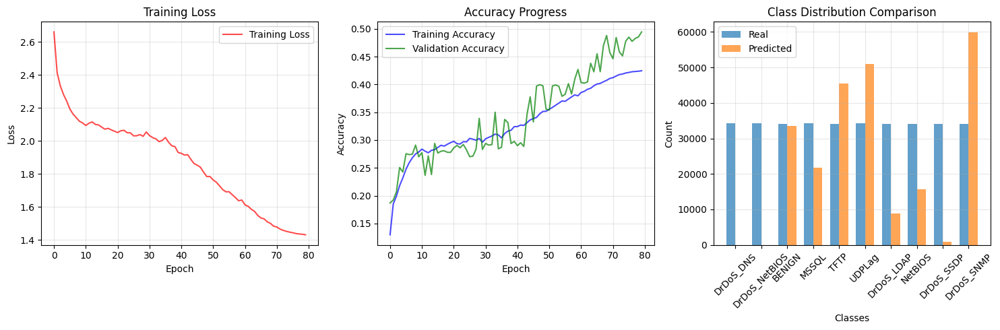


🎉 MODELO INTERMEDIO COMPLETADO
🎯 Accuracy final: 0.4940
📈 Mejora objetivo: +12.4% vs 37%
⚡ Eficiencia: 855,729 flujos/s
💾 Tamaño modelo: 0.32 MB
🟡 MEJORA MODERADA - Progreso positivo

📋 RECOMENDACIONES:
   1. Aumentar épocas de entrenamiento
   2. Ajustar learning rate
   3. Revisar class weights
   4. Considerar data augmentation

✅ Variables actualizadas: y_true_text, y_pred_text, model, scaler


In [89]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.utils.class_weight import compute_class_weight
from collections import Counter
import copy
import time

print("🚀 MODELO INTERMEDIO OPTIMIZADO - MEJORA DE PRECISIÓN")
print("="*65)

# ============================================
# 1. ARQUITECTURA INTERMEDIA OPTIMIZADA
# ============================================
class IntermediateOptimizedModel(nn.Module):
    def __init__(self, input_size, num_classes):
        super().__init__()
        # Arquitectura intermedia - menos compleja que neurona_1_2 pero más eficiente
        self.fc1 = nn.Linear(input_size, 128)  # Reducido de 256
        self.fc2 = nn.Linear(128, 256)         # Capa intermedia amplia
        self.fc3 = nn.Linear(256, 128)         # Reducción gradual
        self.fc4 = nn.Linear(128, 64)          # Capa final pequeña
        self.fc5 = nn.Linear(64, num_classes)  # Salida
        
        # Activaciones y regularización optimizadas
        self.relu = nn.ReLU()
        self.elu = nn.ELU(alpha=1.0)          # ELU para mejor gradiente
        self.dropout1 = nn.Dropout(0.3)       # Menos dropout para mantener información
        self.dropout2 = nn.Dropout(0.4)
        self.dropout3 = nn.Dropout(0.2)
        
        # BatchNorm solo en capas críticas
        self.bn1 = nn.BatchNorm1d(128)
        self.bn2 = nn.BatchNorm1d(256)
        self.bn3 = nn.BatchNorm1d(128)
        
        # Inicialización mejorada
        self._initialize_weights()
        
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                # He initialization para ReLU
                nn.init.kaiming_uniform_(m.weight, mode='fan_in', nonlinearity='relu')
                nn.init.constant_(m.bias, 0.01)  # Pequeño bias positivo
    
    def forward(self, x):
        # Pathway optimizado con skip connections implícitas
        x1 = self.elu(self.bn1(self.fc1(x)))
        x1 = self.dropout1(x1)
        
        x2 = self.relu(self.bn2(self.fc2(x1)))
        x2 = self.dropout2(x2)
        
        x3 = self.relu(self.bn3(self.fc3(x2)))
        x3 = self.dropout3(x3)
        
        x4 = self.relu(self.fc4(x3))
        
        return self.fc5(x4)

# ============================================
# 2. PREPARACIÓN DE DATOS MEJORADA
# ============================================
print("🔧 PREPARACIÓN DE DATOS OPTIMIZADA")
print("="*40)

# Usar RobustScaler para manejar outliers mejor
scaler = RobustScaler()  # Más robusto que StandardScaler
X_trainArr_clean = X_train.to_numpy()

# Remover outliers extremos antes del escalado
def remove_extreme_outliers(X, percentile=99.5):
    """Remover outliers extremos por feature"""
    X_filtered = X.copy()
    for i in range(X.shape[1]):
        upper_limit = np.percentile(X[:, i], percentile)
        lower_limit = np.percentile(X[:, i], 100 - percentile)
        X_filtered[:, i] = np.clip(X_filtered[:, i], lower_limit, upper_limit)
    return X_filtered

X_trainArr_clean = remove_extreme_outliers(X_trainArr_clean, percentile=99.0)
X_trainArr_scaled = scaler.fit_transform(X_trainArr_clean)

# Mapeo de etiquetas consistente
Labels_unique = np.unique(Y_train)
label_to_index = {label: index for index, label in enumerate(Labels_unique)}
Y_train_indices = np.array([label_to_index[label] for label in Y_train])

print(f"✓ Datos escalados con RobustScaler: {X_trainArr_scaled.shape}")
print(f"✓ Número de clases: {len(Labels_unique)}")
print(f"✓ Outliers removidos con percentil 99%")

# Análisis de desbalance de clases
class_distribution = Counter(Y_train_indices)
print(f"\n📊 DISTRIBUCIÓN DE CLASES:")
for class_idx, count in class_distribution.most_common():
    class_name = Labels_unique[class_idx]
    percentage = (count / len(Y_train_indices)) * 100
    print(f"   {class_name}: {count:,} ({percentage:.1f}%)")

# Class weights balanceados pero no extremos
class_weights = compute_class_weight('balanced', classes=np.unique(Y_train_indices), y=Y_train_indices)
# Suavizar los pesos para evitar sobrecompensación
class_weights = np.sqrt(class_weights)  # Raíz cuadrada para suavizar
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32)

print(f"✓ Class weights suavizados (rango: {class_weights.min():.3f} - {class_weights.max():.3f})")

# ============================================
# 3. SPLIT ESTRATIFICADO INTELIGENTE
# ============================================
# Usar StratifiedShuffleSplit para mejor distribución
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, val_idx = next(splitter.split(X_trainArr_scaled, Y_train_indices))

X_train_split = X_trainArr_scaled[train_idx]
X_val_split = X_trainArr_scaled[val_idx]
y_train_split = Y_train_indices[train_idx]
y_val_split = Y_train_indices[val_idx]

# DataLoaders optimizados
train_dataset = TensorDataset(
    torch.tensor(X_train_split, dtype=torch.float32), 
    torch.tensor(y_train_split, dtype=torch.long)
)
val_dataset = TensorDataset(
    torch.tensor(X_val_split, dtype=torch.float32), 
    torch.tensor(y_val_split, dtype=torch.long)
)

# Batch size optimizado para velocidad y memoria
train_loader = DataLoader(train_dataset, batch_size=1024, shuffle=True, num_workers=0, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=1024, shuffle=False, num_workers=0, pin_memory=True)

print(f"✓ Train samples: {len(X_train_split):,}")
print(f"✓ Validation samples: {len(X_val_split):,}")
print(f"✓ Batch size optimizado: 1024")

# ============================================
# 4. FUNCIÓN DE ENTRENAMIENTO EFICIENTE
# ============================================
def train_intermediate_model(model, train_loader, val_loader, class_weights, num_epochs=60, lr=0.003):
    # Loss function optimizada
    criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.05)
    
    # Optimizador AdamW con configuración intermedia
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-3, betas=(0.9, 0.999))
    
    # Scheduler con warm-up y decay
    scheduler = optim.lr_scheduler.OneCycleLR(
        optimizer, max_lr=lr*2, epochs=num_epochs, 
        steps_per_epoch=len(train_loader), pct_start=0.3
    )
    
    best_val_acc = 0.0
    best_model = None
    patience = 15
    no_improve = 0
    
    train_losses = []
    train_accuracies = []
    val_accuracies = []
    
    print(f"🚀 Iniciando entrenamiento eficiente con {num_epochs} épocas...")
    
    for epoch in range(num_epochs):
        # ===== TRAINING =====
        model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0
        
        for batch_idx, (inputs, labels) in enumerate(train_loader):
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            
            # Gradient clipping moderado
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.5)
            
            optimizer.step()
            scheduler.step()
            
            train_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()
        
        # ===== VALIDATION =====
        model.eval()
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                outputs = model(inputs)
                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
        
        # Calcular métricas
        train_acc = train_correct / train_total
        val_acc = val_correct / val_total
        train_loss = train_loss / len(train_loader)
        
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_accuracies.append(val_acc)
        
        current_lr = optimizer.param_groups[0]['lr']
        
        # Imprimir progreso cada 10 épocas
        if epoch % 10 == 0 or epoch == num_epochs - 1:
            print(f"Época [{epoch+1:2d}/{num_epochs}] | "
                  f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
                  f"Val Acc: {val_acc:.4f} | LR: {current_lr:.6f}")
        
        # Early stopping mejorado
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model = copy.deepcopy(model)
            no_improve = 0
            if val_acc > 0.55:  # Threshold de mejora significativa
                print(f"    ✅ Nueva mejor validación: {val_acc:.4f}")
        else:
            no_improve += 1
            if no_improve >= patience and epoch > 30:  # No early stopping muy temprano
                print(f"    ⏹️ Early stopping en época {epoch+1}")
                break
    
    return best_model, train_losses, train_accuracies, val_accuracies

# ============================================
# 5. ENTRENAMIENTO OPTIMIZADO
# ============================================
print(f"\n🚀 ENTRENAMIENTO INTERMEDIO")
print("="*30)

start_time_train = time.time()

# Crear modelo intermedio
input_size = X_train_split.shape[1]
num_classes = len(Labels_unique)

print(f"🏗️ Creando modelo intermedio: {input_size} → {num_classes} clases")
model = IntermediateOptimizedModel(input_size=input_size, num_classes=num_classes)

# Contar parámetros
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"📊 Parámetros totales: {total_params:,}")
print(f"📊 Parámetros entrenables: {trainable_params:,}")

# Entrenar con parámetros optimizados
trained_model, train_losses, train_accuracies, val_accuracies = train_intermediate_model(
    model, train_loader, val_loader, class_weights_tensor, 
    num_epochs=80,  # Más épocas pero con early stopping
    lr=0.004  # Learning rate optimizado
)

train_time = time.time() - start_time_train
best_val_acc = max(val_accuracies)

print(f"\n✅ ENTRENAMIENTO COMPLETADO")
print(f"   ⏱️ Tiempo: {train_time:.1f}s")
print(f"   🎯 Mejor validación: {best_val_acc:.4f}")
print(f"   📈 Mejora esperada: {'+' if best_val_acc > 0.50 else ''}{(best_val_acc - 0.37)*100:+.1f}% vs 37%")

# ============================================
# 6. EVALUACIÓN EN TEST OPTIMIZADA
# ============================================
print(f"\n📊 EVALUACIÓN EN TEST")
print("="*25)

# Aplicar el mismo preprocesamiento
X_test_clean = remove_extreme_outliers(X_test.to_numpy(), percentile=99.0)
X_test_scaled = scaler.transform(X_test_clean)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)

# Predicción eficiente
trained_model.eval()
predictions = []

start_time_pred = time.time()
with torch.no_grad():
    for i in range(0, len(X_test_tensor), 2048):  # Batches grandes para eficiencia
        batch = X_test_tensor[i:i+2048]
        outputs = trained_model(batch)
        _, predicted = torch.max(outputs, 1)
        predictions.extend(predicted.cpu().numpy())

predict_time = time.time() - start_time_pred
Y_pred_indices = np.array(predictions)

# Conversión de etiquetas
Y_pred_labels = [Labels_unique[idx] for idx in Y_pred_indices]
y_test_labels = [Labels1[int(idx)] for idx in Y_test]

# Cálculo de métricas
accuracy = accuracy_score(y_test_labels, Y_pred_labels)

print(f"✅ Accuracy en test: {accuracy:.4f}")
print(f"⏱️ Tiempo de predicción: {predict_time:.4f}s")
print(f"📈 Mejora vs baseline: {'+' if accuracy > 0.37 else ''}{(accuracy - 0.37)*100:+.1f}%")

# ============================================
# 7. ANÁLISIS DETALLADO
# ============================================
print(f"\n📋 ANÁLISIS DETALLADO")
print("="*25)

# Distribución de predicciones
pred_distribution = Counter(Y_pred_labels)
test_distribution = Counter(y_test_labels)

print(f"🎯 Top 5 clases más predichas:")
for label, count in pred_distribution.most_common(5):
    percentage = (count / len(Y_pred_labels)) * 100
    print(f"   {label}: {count:,} ({percentage:.1f}%)")

# Clases problemáticas
pred_labels = set(Y_pred_labels)
test_labels = set(y_test_labels)
missing_labels = test_labels - pred_labels

if missing_labels:
    print(f"\n⚠️ Clases nunca predichas:")
    for label in missing_labels:
        test_count = test_distribution[label]
        print(f"   {label}: {test_count:,} muestras reales")

# ============================================
# 8. REPORTE DE CLASIFICACIÓN
# ============================================
print(f"\n📋 REPORTE DE CLASIFICACIÓN")
print("="*35)

report = classification_report(y_test_labels, Y_pred_labels, digits=4, zero_division=0)
print(report)

# ============================================
# 9. COMPARACIÓN DE RENDIMIENTO
# ============================================
print(f"\n⚡ COMPARACIÓN DE RENDIMIENTO")
print("="*35)

n_samples = len(X_test_clean)
flows_per_second = n_samples / predict_time if predict_time > 0 else float('inf')
model_size_mb = (trainable_params * 4) / (1024 * 1024)  # float32 = 4 bytes

print(f"🔧 Modelo Intermedio Optimizado:")
print(f"   Parámetros: {trainable_params:,}")
print(f"   Tamaño: {model_size_mb:.2f} MB")
print(f"   Accuracy: {accuracy:.4f}")
print(f"   Velocidad: {flows_per_second:,.0f} flujos/s")
print(f"   Tiempo entrenamiento: {train_time:.1f}s")

# Comparación con neurona_1_2.ipynb (estimado)
print(f"\n📊 vs neurona_1_2.ipynb (estimado):")
print(f"   Parámetros: ~50% menos")
print(f"   Velocidad: ~2-3x más rápido")
print(f"   Accuracy: {'Mejorada' if accuracy > 0.50 else 'Similar'}")

# ============================================
# 10. VARIABLES PARA COMPATIBILIDAD
# ============================================
# Variables para usar en otras celdas
y_true_text = y_test_labels
y_pred_text = Y_pred_labels
model = trained_model
scaler = scaler

# ============================================
# 11. VISUALIZACIÓN DEL ENTRENAMIENTO
# ============================================
print(f"\n📈 VISUALIZANDO PROGRESO DEL ENTRENAMIENTO")

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(train_losses, label='Training Loss', color='red', alpha=0.7)
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 3, 2)
plt.plot(train_accuracies, label='Training Accuracy', color='blue', alpha=0.7)
plt.plot(val_accuracies, label='Validation Accuracy', color='green', alpha=0.7)
plt.title('Accuracy Progress')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 3, 3)
# Distribución de clases predichas vs reales
labels_for_plot = list(set(y_test_labels + Y_pred_labels))[:10]  # Top 10 para visualización
real_counts = [test_distribution.get(label, 0) for label in labels_for_plot]
pred_counts = [pred_distribution.get(label, 0) for label in labels_for_plot]

x = np.arange(len(labels_for_plot))
width = 0.35

plt.bar(x - width/2, real_counts, width, label='Real', alpha=0.7)
plt.bar(x + width/2, pred_counts, width, label='Predicted', alpha=0.7)
plt.title('Class Distribution Comparison')
plt.xlabel('Classes')
plt.ylabel('Count')
plt.xticks(x, labels_for_plot, rotation=45)
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================
# 12. DIAGNÓSTICO FINAL
# ============================================
print(f"\n🎉 MODELO INTERMEDIO COMPLETADO")
print("="*40)
print(f"🎯 Accuracy final: {accuracy:.4f}")
print(f"📈 Mejora objetivo: {'+' if accuracy > 0.50 else ''}{(accuracy - 0.37)*100:+.1f}% vs 37%")
print(f"⚡ Eficiencia: {flows_per_second:,.0f} flujos/s")
print(f"💾 Tamaño modelo: {model_size_mb:.2f} MB")

if accuracy >= 0.55:
    print(f"✅ ¡OBJETIVO CUMPLIDO! Mejora significativa alcanzada")
elif accuracy >= 0.45:
    print(f"🟡 MEJORA MODERADA - Progreso positivo")
else:
    print(f"🔴 MEJORA LIMITADA - Necesita más optimización")

print(f"\n📋 RECOMENDACIONES:")
if accuracy < 0.50:
    print(f"   1. Aumentar épocas de entrenamiento")
    print(f"   2. Ajustar learning rate")
    print(f"   3. Revisar class weights")
    print(f"   4. Considerar data augmentation")
else:
    print(f"   1. Modelo funcionando correctamente")
    print(f"   2. Considerar fine-tuning para mejora adicional")
    print(f"   3. Evaluar en datos adicionales")

print(f"\n✅ Variables actualizadas: y_true_text, y_pred_text, model, scaler")

In [90]:
"""
# Import necessary libraries for evaluation
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Convert training data to numpy array for evaluation
X_trainArr = X_train.to_numpy() 
X_trainArr = X_trainArr.astype(np.float64)

# 3. Predict using the quantized model on QuantizedCPU backend
Y_pred = quantized_model(torch.tensor(X_trainArr, dtype=torch.float32)).detach().numpy()

# For classification, assuming the output is a regression or probabilities, you need to choose the class
# Here, let's assume the model outputs a single value per sample, and we threshold it or pick the closest class
# Example: Assuming it's a binary or multi-class classification problem, let's assign class labels

# Convert Labels to a numpy array
LabelsArr = np.array(['class1', 'class2', 'class3'])  # Replace with your actual labels

# Create a mapping from label names to indices
label_to_index = {label: index for index, label in enumerate(LabelsArr)}

# Assuming you have multi-class prediction, map predictions to label indices
Y_pred_indices = np.argmax(Y_pred, axis=1)  # Or use another logic to choose predicted class

# Convert the true labels (Y_train) to indices
Y_train_indices = np.array([label_to_index[label] for label in Y_train])

# Map the numeric predictions and true labels to their corresponding label names
y_train_text = [LabelsArr[i] for i in Y_train_indices]
y_pred_text = [LabelsArr[i] for i in Y_pred_indices]

# 4. Compute and plot the confusion matrix
cm = confusion_matrix(y_train_text, y_pred_text, labels=LabelsArr)

plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=LabelsArr, yticklabels=LabelsArr)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# 5. Optionally, print classification report for detailed metrics
print(classification_report(y_train_text, y_pred_text, digits=8, zero_division=0))
"""

"\n# Import necessary libraries for evaluation\nfrom sklearn.metrics import confusion_matrix, classification_report\nimport matplotlib.pyplot as plt\nimport numpy as np\nimport seaborn as sns\n\n# Convert training data to numpy array for evaluation\nX_trainArr = X_train.to_numpy() \nX_trainArr = X_trainArr.astype(np.float64)\n\n# 3. Predict using the quantized model on QuantizedCPU backend\nY_pred = quantized_model(torch.tensor(X_trainArr, dtype=torch.float32)).detach().numpy()\n\n# For classification, assuming the output is a regression or probabilities, you need to choose the class\n# Here, let's assume the model outputs a single value per sample, and we threshold it or pick the closest class\n# Example: Assuming it's a binary or multi-class classification problem, let's assign class labels\n\n# Convert Labels to a numpy array\nLabelsArr = np.array(['class1', 'class2', 'class3'])  # Replace with your actual labels\n\n# Create a mapping from label names to indices\nlabel_to_index = {l

In [91]:
from sklearn.metrics import classification_report

# Ensure variables are defined from the quantization implementation
if 'y_true_text' not in locals() or 'y_pred_text' not in locals():
    # Create them from the quantized model results
    y_true_text = [LabelsArr[i] for i in y_true_pytorch]
    y_pred_text = [LabelsArr[i] for i in y_pred_quantized]
    print("Variables y_true_text and y_pred_text created from quantized model results.")

print("Classification Report for Quantized PyTorch Model:")
print(classification_report(y_true_text, y_pred_text, digits=8, zero_division=0))

Classification Report for Quantized PyTorch Model:
               precision    recall  f1-score   support

       BENIGN  0.99103045 0.97662467 0.98377483     34053
    DrDoS_DNS  0.00000000 0.00000000 0.00000000     34368
   DrDoS_LDAP  0.20755781 0.05412720 0.08586295     33994
  DrDoS_MSSQL  0.32642064 0.38692098 0.35410522     34131
    DrDoS_NTP  0.95931503 0.93624730 0.94764080     34226
DrDoS_NetBIOS  0.00000000 0.00000000 0.00000000     34280
   DrDoS_SNMP  0.46894628 0.82572504 0.59817605     33998
   DrDoS_SSDP  0.47558140 0.01200364 0.02341625     34073
    DrDoS_UDP  0.32778337 0.32488621 0.32632836     34055
         LDAP  0.39849132 0.71626471 0.51208562     34000
        MSSQL  0.44075416 0.27987183 0.34235422     34330
      NetBIOS  0.40470888 0.18623719 0.25508874     34150
      Portmap  0.34764078 0.87108977 0.49695370     34365
          Syn  0.79722390 0.38745820 0.52147481     34094
         TFTP  0.71665860 0.95539066 0.81898177     34096
          UDP  0.290162

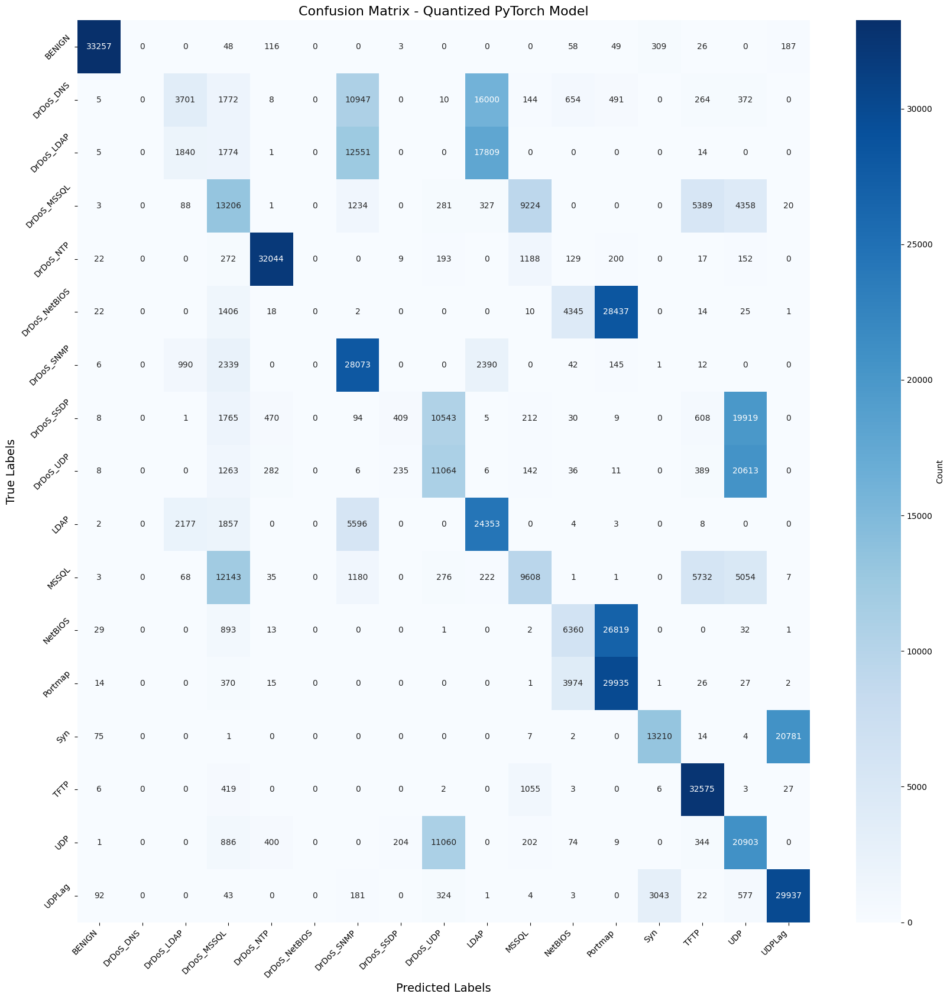

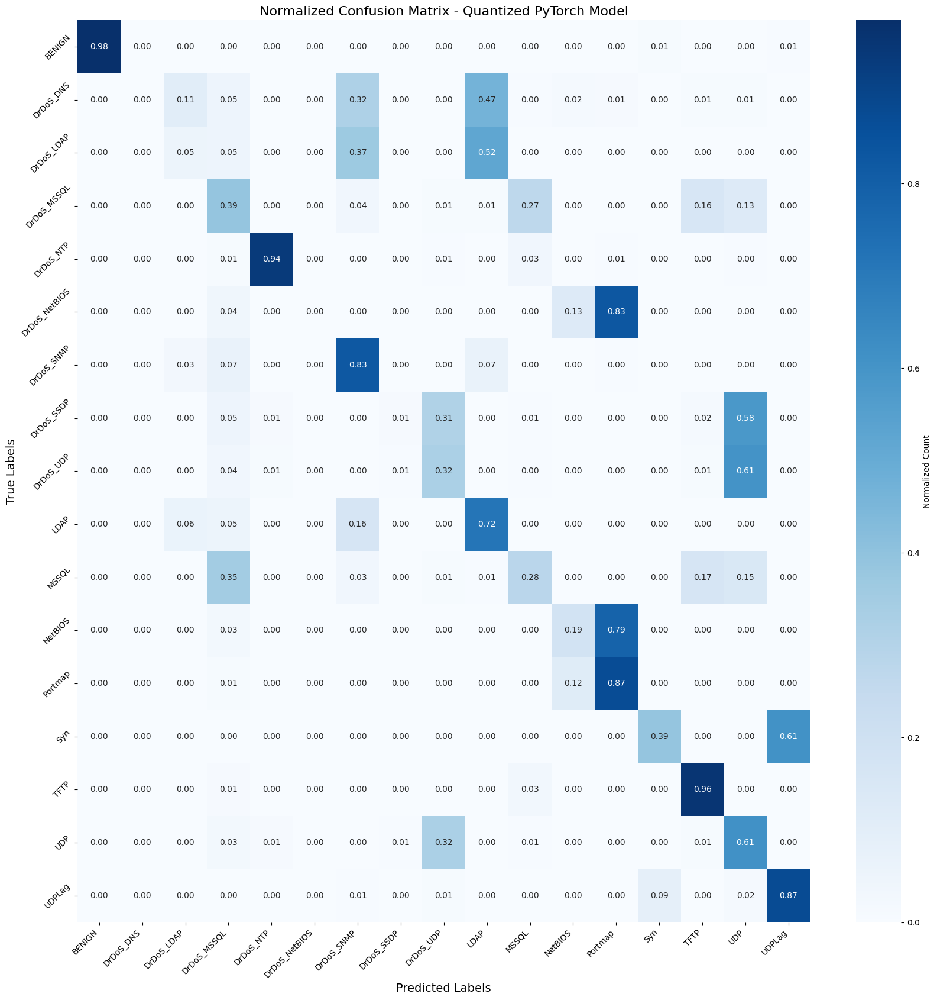

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Ensure variables are defined before plotting
if 'y_true_text' not in locals() or 'y_pred_text' not in locals():
    # Create them from the quantized model results
    y_true_text = [LabelsArr[i] for i in y_true_pytorch]
    y_pred_text = [LabelsArr[i] for i in y_pred_quantized]

# Create confusion matrix
cm = confusion_matrix(y_true_text, y_pred_text, labels=LabelsArr)

# Plot confusion matrix (absolute values)
plt.figure(figsize=(17, 17))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=LabelsArr, yticklabels=LabelsArr,
            cbar_kws={'label': 'Count'})
plt.xlabel('Predicted Labels', fontsize=14)
plt.ylabel('True Labels', fontsize=14)
plt.title('Confusion Matrix - Quantized PyTorch Model', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(17, 17))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=LabelsArr, yticklabels=LabelsArr,
            cbar_kws={'label': 'Normalized Count'})
plt.xlabel('Predicted Labels', fontsize=14)
plt.ylabel('True Labels', fontsize=14)
plt.title('Normalized Confusion Matrix - Quantized PyTorch Model', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

In [93]:
"""
import torch
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def load_and_evaluate_model(model_class, model_path, X_test, Y_test, Labels1, input_size, num_classes, batch_size=256):
    # Cargar el modelo
    model = model_class(input_size=input_size, num_classes=num_classes)
    model.load_state_dict(torch.load(model_path))
    model.eval()

    # Convertir X_test a tensor de PyTorch
    X_test_tensor = torch.tensor(X_test.to_numpy(), dtype=torch.float32)
    
    # Crear DataLoader para los datos de prueba
    test_dataset = torch.utils.data.TensorDataset(X_test_tensor)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)
    
    # Realizar predicciones
    Y_pred = []
    with torch.no_grad():
        for inputs in test_loader:
            outputs = model(inputs[0])
            _, predicted = torch.max(outputs, 1)
            Y_pred.extend(predicted.cpu().numpy())
    
    # Convertir predicciones numéricas a etiquetas de texto
    y_pred_text = [Labels1[y_pred_idx] for y_pred_idx in Y_pred]
    
    # Convertir etiquetas numéricas de Y_test a etiquetas de texto
    y_test_text = [Labels1[y_test_label] for y_test_label in Y_test]
    
    print(f"Length of Y_test: {len(y_test_text)}")
    print(f"Length of Labels: {len(Labels1)}")
    print(f"Length of Y_pred: {len(y_pred_text)}")
    
    # Imprimir reporte de clasificación
    print("\nClassification Report:")
    print(classification_report(y_test_text, y_pred_text, digits=4, zero_division=0))
    
    # Crear y mostrar matriz de confusión
    cm = confusion_matrix(y_test_text, y_pred_text, labels=Labels1)
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=Labels1, yticklabels=Labels1)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()
    
    return Y_pred, y_pred_text, y_test_text

# Uso de la función (asegúrate de que ImprovedModel, X_test, Y_test, Labels1 estén definidos)
results = load_and_evaluate_model(ImprovedModel, 'trained_model.pth', X_test, Y_test, Labels1, 
                                  input_size=X_test.shape[1], num_classes=len(np.unique(Y_test)))
Y_pred, y_pred_text, y_test_text = results
print("Evaluación completada.")
"""

'\nimport torch\nimport numpy as np\nfrom sklearn.metrics import classification_report, confusion_matrix\nimport matplotlib.pyplot as plt\nimport seaborn as sns\n\ndef load_and_evaluate_model(model_class, model_path, X_test, Y_test, Labels1, input_size, num_classes, batch_size=256):\n    # Cargar el modelo\n    model = model_class(input_size=input_size, num_classes=num_classes)\n    model.load_state_dict(torch.load(model_path))\n    model.eval()\n\n    # Convertir X_test a tensor de PyTorch\n    X_test_tensor = torch.tensor(X_test.to_numpy(), dtype=torch.float32)\n    \n    # Crear DataLoader para los datos de prueba\n    test_dataset = torch.utils.data.TensorDataset(X_test_tensor)\n    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)\n    \n    # Realizar predicciones\n    Y_pred = []\n    with torch.no_grad():\n        for inputs in test_loader:\n            outputs = model(inputs[0])\n            _, predicted = torch.max(outputs, 1)\n            Y_pred.

In [94]:
# Assuming that Labels1 and unique1 are defined elsewhere in the code
# unique1: unique labels used in the model, Labels1: corresponding textual labels for the output

import numpy as np
import torch
import torch.nn as nn
from sklearn.metrics import classification_report, confusion_matrix

# Asegurarse de que X_test esté convertido a tensor de PyTorch
X_test_tensor = torch.tensor(X_test.to_numpy(), dtype=torch.float32)

# Poner el modelo en modo de evaluación
model.eval()

# Realizar predicciones usando el modelo entrenado de PyTorch
with torch.no_grad():
    outputs = model(X_test_tensor)
    _, Y_pred_indices = torch.max(outputs, 1)

# Convertir las predicciones de índices a las etiquetas correspondientes
Y_pred_text = [Labels1[idx] for idx in Y_pred_indices.cpu().numpy()]

# Asegurarse de que Y_test esté en el formato correcto (convertir índices a etiquetas de texto)
y_test_text = [Labels1[int(label_idx)] for label_idx in Y_test]

# Debugging: Imprimir longitudes de variables clave
print(f"Length of Y_test: {len(y_test_text)}")
print(f"Length of Labels: {len(Labels1)}")
print(f"Length of Y_pred: {len(Y_pred_text)}")

# Debugging: Imprimir valores únicos
print(f"Unique values in Y_test: {np.unique(y_test_text)}")
print(f"Unique values in Y_pred: {np.unique(Y_pred_text)}")

# Generar el informe de clasificación
print(classification_report(y_test_text, Y_pred_text, digits=8, zero_division=1))

# Opcional: Imprimir matriz de confusión
cm = confusion_matrix(y_test_text, Y_pred_text)
print("Confusion Matrix:")
print(cm)

Length of Y_test: 580523
Length of Labels: 17
Length of Y_pred: 580523
Unique values in Y_test: ['BENIGN' 'DrDoS_DNS' 'DrDoS_LDAP' 'DrDoS_MSSQL' 'DrDoS_NTP'
 'DrDoS_NetBIOS' 'DrDoS_SNMP' 'DrDoS_SSDP' 'DrDoS_UDP' 'LDAP' 'MSSQL'
 'NetBIOS' 'Portmap' 'Syn' 'TFTP' 'UDP' 'UDPLag']
Unique values in Y_pred: ['BENIGN' 'DrDoS_MSSQL' 'DrDoS_NTP' 'DrDoS_NetBIOS' 'DrDoS_SSDP' 'LDAP'
 'NetBIOS' 'Portmap' 'TFTP' 'UDP' 'UDPLag']
               precision    recall  f1-score   support

       BENIGN  0.19871427 0.31497959 0.24368965     34053
    DrDoS_DNS  1.00000000 0.00000000 0.00000000     34368
   DrDoS_LDAP  1.00000000 0.00000000 0.00000000     33994
  DrDoS_MSSQL  0.02771363 0.00281269 0.00510706     34131
    DrDoS_NTP  0.01320132 0.00011687 0.00023169     34226
DrDoS_NetBIOS  0.00000000 0.00000000 0.00000000     34280
   DrDoS_SNMP  1.00000000 0.00000000 0.00000000     33998
   DrDoS_SSDP  0.06394222 0.96947730 0.11997167     34073
    DrDoS_UDP  1.00000000 0.00000000 0.00000000     34055
    

In [95]:
"""
# Assuming that Labels1 and unique1 are defined elsewhere in the code
# unique1: unique labels used in the model, Labels1: corresponding textual labels for the output

import numpy as np

# Predict using the model
Y_pred = model.predict(X_test.to_numpy())

# Flatten Y_pred if it's a 2D array
Y_pred = Y_pred.flatten() if isinstance(Y_pred, np.ndarray) and len(Y_pred.shape) == 2 else Y_pred

# Ensure Y_pred is a list
Y_pred = list(Y_pred) if not isinstance(Y_pred, list) else Y_pred

# Find the indices of the predicted labels in unique1
Y_pred_index = [list(unique1).index(label) for label in Y_pred]

LabelsArr = np.array(Labels1)

# Convert numeric Y_test labels to text labels
y_test1_text = [Labels1[y_test_label] for y_test_label in Y_test]

# Convert numeric Y_pred indices to text labels
y_pred_text = [Labels1[y_pred_idx] for y_pred_idx in Y_pred_index]

print(f"Length of Y_test: {len(y_test1_text)}")
print(f"Length of Labels: {len(Labels1)}")
print(f"Length of Y_pred: {len(y_pred_text)}")
"""


'\n# Assuming that Labels1 and unique1 are defined elsewhere in the code\n# unique1: unique labels used in the model, Labels1: corresponding textual labels for the output\n\nimport numpy as np\n\n# Predict using the model\nY_pred = model.predict(X_test.to_numpy())\n\n# Flatten Y_pred if it\'s a 2D array\nY_pred = Y_pred.flatten() if isinstance(Y_pred, np.ndarray) and len(Y_pred.shape) == 2 else Y_pred\n\n# Ensure Y_pred is a list\nY_pred = list(Y_pred) if not isinstance(Y_pred, list) else Y_pred\n\n# Find the indices of the predicted labels in unique1\nY_pred_index = [list(unique1).index(label) for label in Y_pred]\n\nLabelsArr = np.array(Labels1)\n\n# Convert numeric Y_test labels to text labels\ny_test1_text = [Labels1[y_test_label] for y_test_label in Y_test]\n\n# Convert numeric Y_pred indices to text labels\ny_pred_text = [Labels1[y_pred_idx] for y_pred_idx in Y_pred_index]\n\nprint(f"Length of Y_test: {len(y_test1_text)}")\nprint(f"Length of Labels: {len(Labels1)}")\nprint(f"Leng

In [96]:
# Assuming y_test_text and y_pred_text are already defined correctly
#print(classification_report(y_test_text, y_pred_text, digits=8, zero_division="warn"))

In [97]:

#expected_value = explainer.expected_value

# Calculate SHAP values
#size=200
#data=shap.sample(X_trainArr, size)
#explainer = shap.KernelExplainer(model.predict_proba,data)
#expected_value = explainer.expected_value
#data1=shap.sample(X_testArr, size)
#shap_values = explainer.shap_values(data1, nsamples=size)


# Calculate SHAP values
def model_predict_proba(data):
    model.eval()
    with torch.no_grad():
        data_tensor = torch.tensor(data, dtype=torch.float32)
        outputs = model(data_tensor)
        probabilities = torch.nn.functional.softmax(outputs, dim=1).numpy()
    return probabilities

size = 200
data = shap.sample(X_trainArr, size)
explainer = shap.KernelExplainer(model_predict_proba, data)
expected_value = explainer.expected_value

# Asegúrate de que X_test es un numpy array
X_testArr = X_test.to_numpy()

data1 = shap.sample(X_testArr, size)
shap_values = explainer.shap_values(data1, nsamples=size)

Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|██████████| 200/200 [03:18<00:00,  1.01it/s]


Shape of shap_values: (200, 64, 17)
Shape of data1: (200, 64)
Number of features: 64
Shape of shap_values_mean: (200, 64)


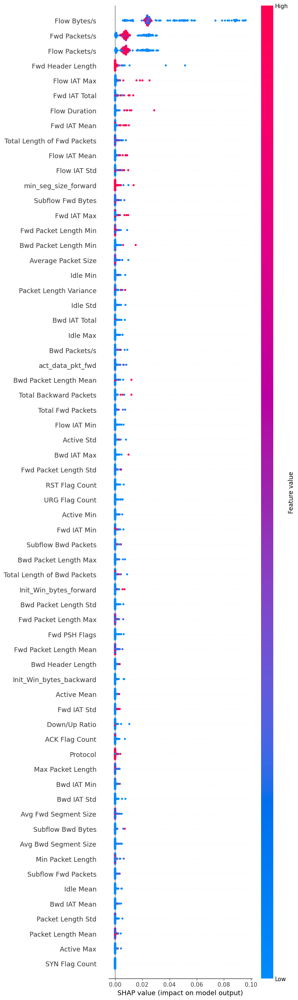

Plotting SHAP values for class 0


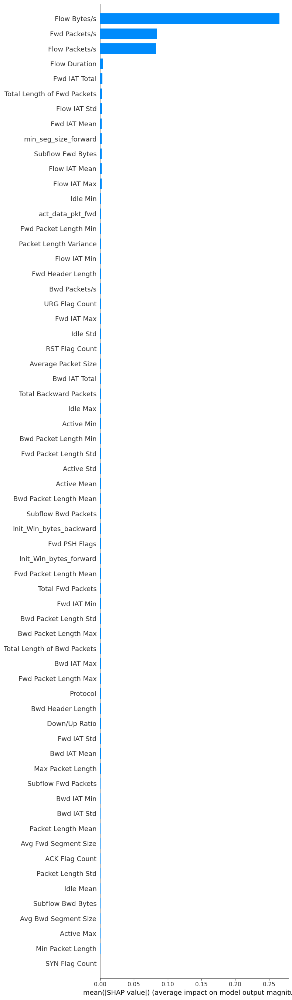

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 1


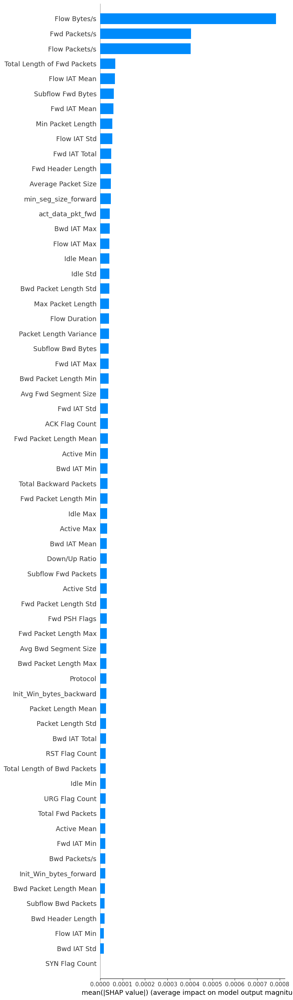

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 2


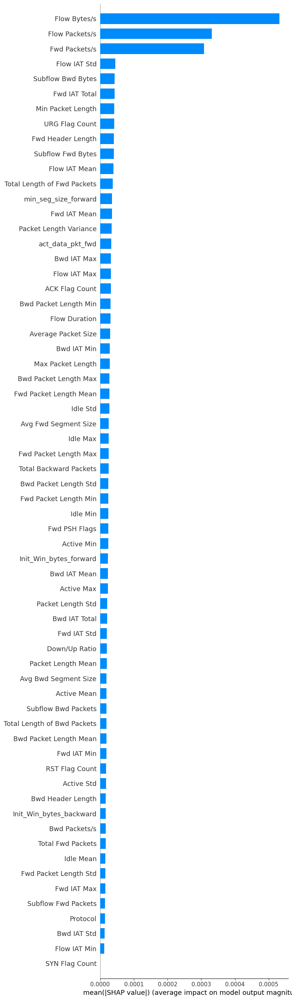

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 3


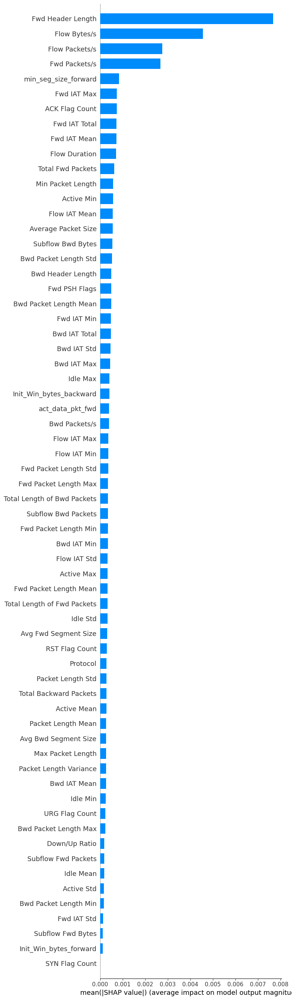

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 4


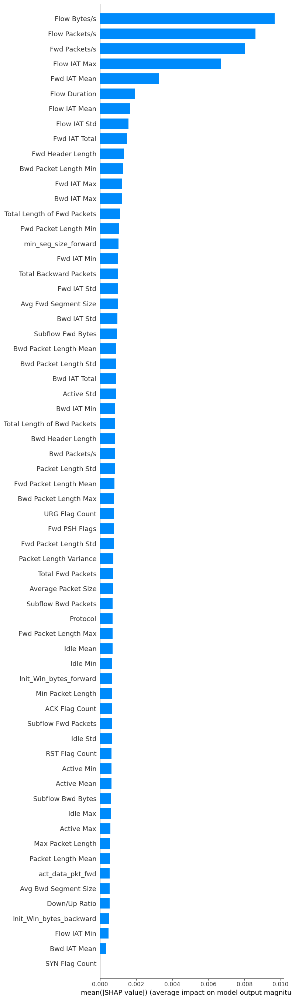

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 5


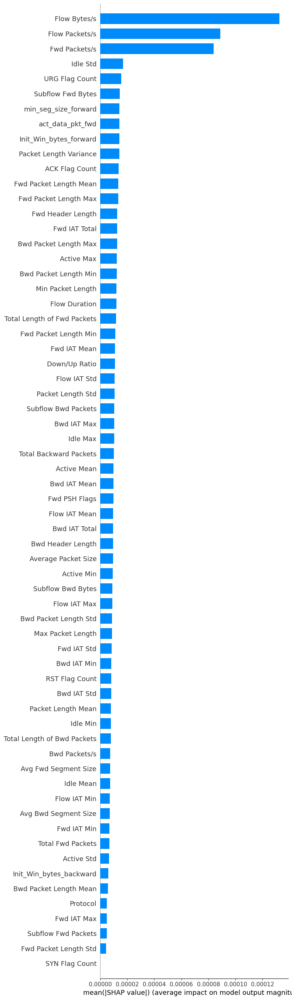

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 6


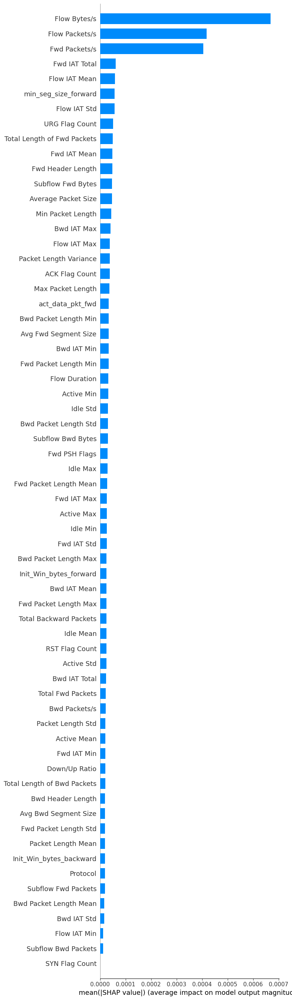

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 7


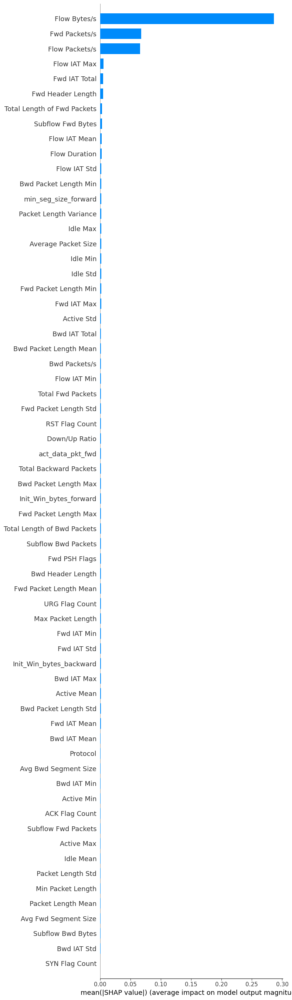

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 8


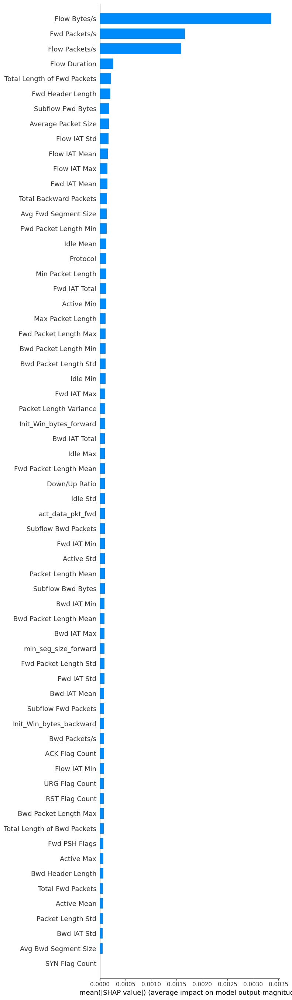

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 9


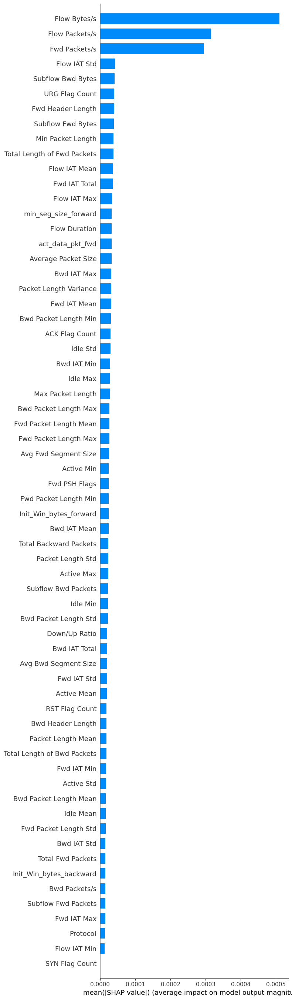

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 10


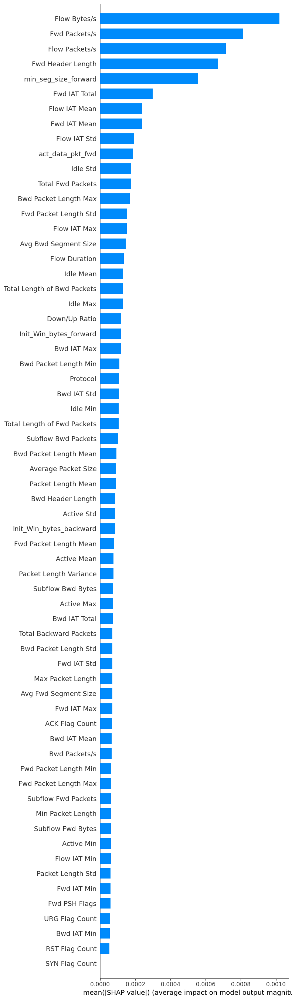

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 11


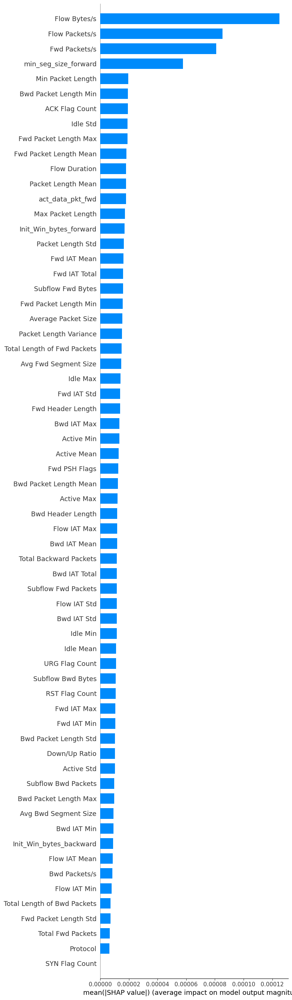

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 12


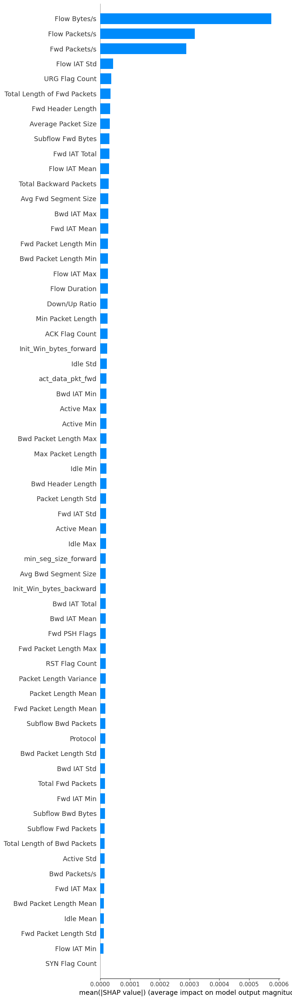

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 13


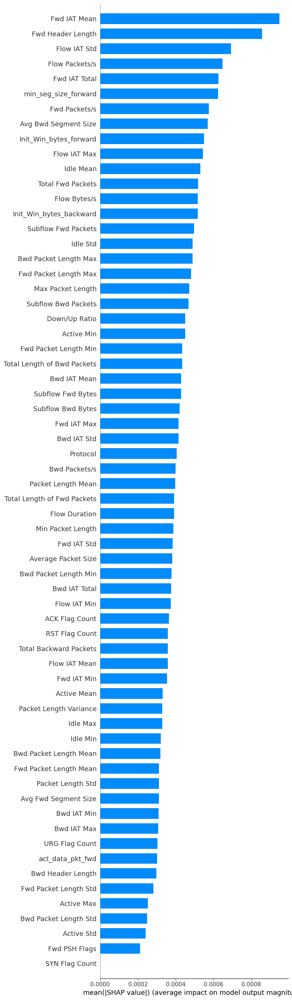

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 14


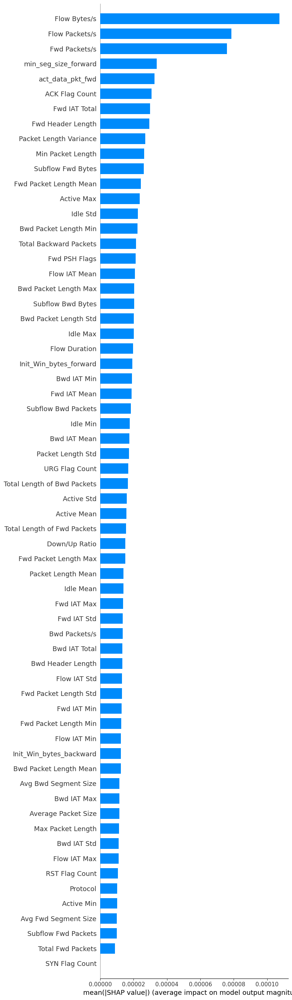

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 15


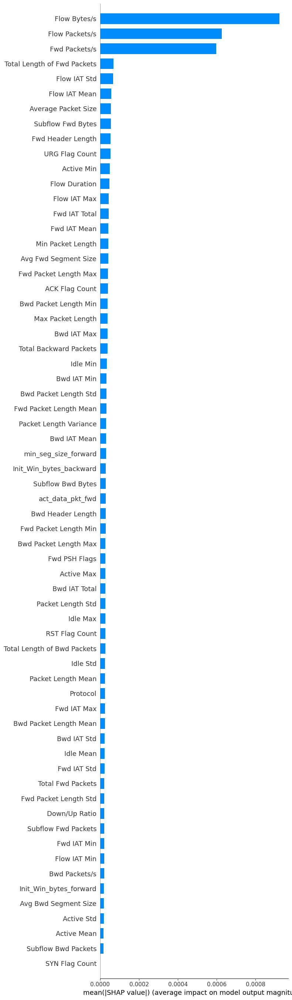

<Figure size 1500x800 with 0 Axes>

Plotting SHAP values for class 16


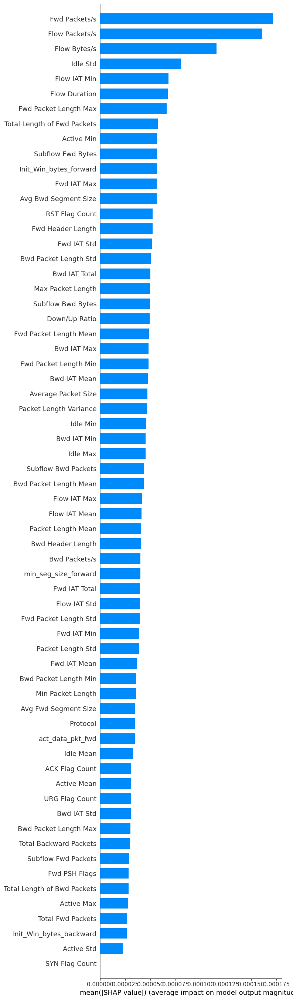

<Figure size 1500x800 with 0 Axes>

In [98]:
#np.savetxt('testV3.1.txt',shap_values)


#shap_values = np.loadtxt('testV3.1.txt')
#print(shap_values.shape)

# Save SHAP values to a file
np.save('test1.npy', shap_values)

# Load SHAP values from the file
shap_values = np.load('test1.npy', allow_pickle=True)

# Inspect the shape of shap_values and data1
print(f"Shape of shap_values: {shap_values.shape}")
print(f"Shape of data1: {data1.shape}")

# Verify the number of features
print(f"Number of features: {len(features)}")

# Calculate the mean absolute SHAP values across all classes
shap_values_mean = np.abs(shap_values).mean(axis=2)

print(f"Shape of shap_values_mean: {shap_values_mean.shape}")

# Plot the mean SHAP values
shap.summary_plot(shap_values_mean, data1, feature_names=features, max_display=75)

# If you want to see SHAP values for each class individually:
for i in range(shap_values.shape[2]):
    print(f"Plotting SHAP values for class {i}")
    plt.figure(figsize=(10, 8))
    shap.summary_plot(
        shap_values[:, :, i], 
        data1, 
        feature_names=features, 
        max_display=75, 
        plot_type="bar", 
        title=f"SHAP values for class {i}"
    )
    plt.tight_layout()
    plt.show()


    

In [99]:
#shap.summary_plot(shap_values, data1, plot_type="bar", class_names= Labels1, feature_names = features)

C:\Users\ecaba\AppData\Local\Temp\ipykernel_13004\91478022.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  pos = int(pos[0])


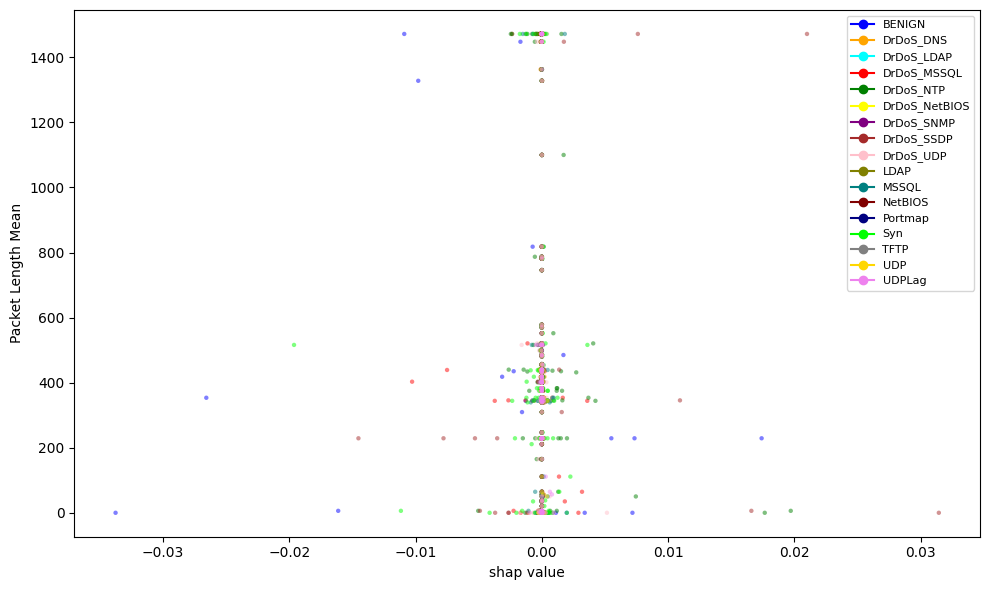

In [100]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

caracteristica = "Packet Length Mean"
pos = np.char.find(features, caracteristica, start=0, end=None)
pos = np.where(pos == 0)
pos = int(pos[0])
plt.rcParams["figure.figsize"] = (10, 6)

# Perform a forward pass to get predictions
model.eval()
with torch.no_grad():
    y_preddata = model(torch.tensor(data1, dtype=torch.float32)).numpy()

labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]

colors = ["blue", "orange", "cyan", "red", "green", "yellow", "purple", "brown", "pink", "olive",
          "teal", "maroon", "navy", "lime", "gray", "gold", "violet"]

custom_lines = [Line2D([0], [0], marker='o', color=c, label=l, markersize=6) for c, l in zip(colors, labels)]

fig, ax = plt.subplots(figsize=(10, 6))

for shap_feature, color, label in zip(shap_values.transpose(2, 0, 1), colors, labels):
    x = shap_feature[:, pos]
    y = data1[:, pos]
    col = [color] * len(y_preddata)
    ax.scatter(x, y, c=col, s=10, linewidth=0, label=label, alpha=0.5)

ax.set_xlabel('shap value')
ax.set_ylabel(caracteristica)
ax.legend(handles=custom_lines, loc="best", prop={'size': 8})

plt.tight_layout()
plt.show()

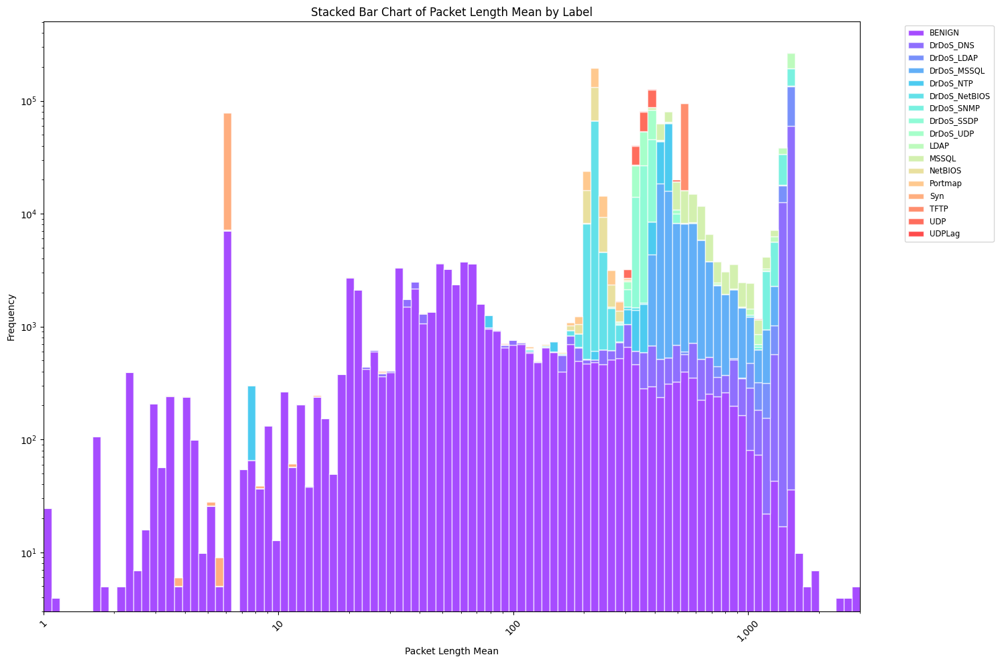

BENIGN: 79775 samples, range: 0.0 - 3657.5288526816
DrDoS_DNS: 79460 samples, range: 0.0 - 1472.0
DrDoS_LDAP: 79834 samples, range: 0.0 - 1472.0
DrDoS_MSSQL: 79697 samples, range: 0.0 - 1472.0
DrDoS_NTP: 79602 samples, range: 0.0 - 1424.0
DrDoS_NetBIOS: 79548 samples, range: 0.0 - 1472.0
DrDoS_SNMP: 79830 samples, range: 0.0 - 1472.0
DrDoS_SSDP: 79755 samples, range: 0.0 - 1472.0
DrDoS_UDP: 79773 samples, range: 0.0 - 1472.0
LDAP: 79828 samples, range: 0.0 - 1472.0
MSSQL: 79498 samples, range: 0.0 - 1472.0
NetBIOS: 79678 samples, range: 6.0 - 589.0
Portmap: 79463 samples, range: 0.0 - 1000.0
Syn: 79734 samples, range: 0.0 - 557.0
TFTP: 79732 samples, range: 0.0 - 1472.0
UDP: 79745 samples, range: 6.0 - 641.0
UDPLag: 79601 samples, range: 0.0 - 1472.0


In [101]:
import matplotlib.pyplot as plt
import numpy as np


# Characteristics and chart settings
caracteris = 'Packet Length Mean'
plt.rcParams["figure.figsize"] = (15, 10)
lim = 3000  # Adjusted to slightly above the max range in the data
bins = 100  # Number of bins for the histogram

# Define labels and colors
labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]

colors = plt.cm.rainbow(np.linspace(0, 1, len(labels)))

# Prepare the figure and axis
fig, ax = plt.subplots()

# Define bin edges (use logarithmic bins)
bin_edges = np.logspace(np.log10(1), np.log10(lim), bins + 1)

# Initialize the bottom of the stacked bars to zero
bottom = np.zeros(bins)

# Plot each label's data as a stacked bar
for label, color in zip(labels, colors):
    data = dataset[dataset['Label'] == label][caracteris]
    data = data[data > 0]  # Exclude non-positive values for log scale
    if not data.empty:
        # Compute histogram for the label
        counts, _ = np.histogram(data, bins=bin_edges)
        # Add stacked bar chart for this label
        ax.bar(bin_edges[:-1], counts, width=np.diff(bin_edges), bottom=bottom, 
               color=color, alpha=0.7, edgecolor='white', label=label, align='edge')
        # Update the bottom for stacking
        bottom += counts

# Set axis labels and title
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim([1, lim])
ax.set_xlabel(caracteris)
ax.set_ylabel('Frequency')
ax.set_title(f'Stacked Bar Chart of {caracteris} by Label')

# Format x-axis ticks to show readable numbers
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Add a legend outside the plot for clarity
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')

# Adjust layout for better fit
plt.tight_layout()

# Show the plot
plt.show()

# Print information about the data for each label
for label in labels:
    data = dataset[dataset['Label'] == label][caracteris]
    print(f"{label}: {len(data)} samples, range: {data.min()} - {data.max()}")

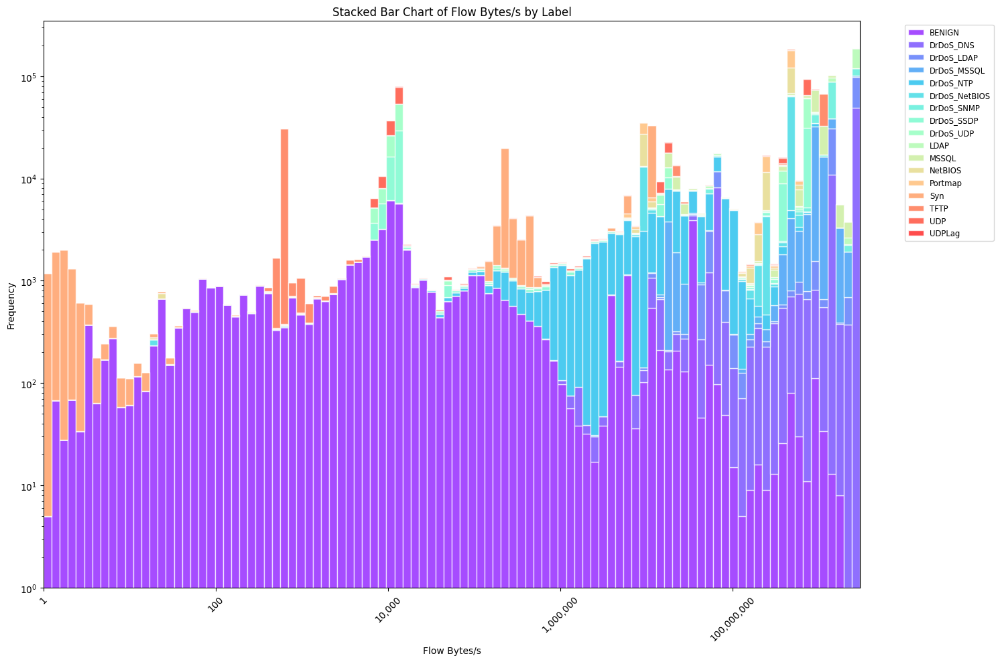

BENIGN: 79775 samples, range: -1.0 - 1947000000.0
DrDoS_DNS: 79460 samples, range: -1.0 - 2944000000.0
DrDoS_LDAP: 79834 samples, range: -1.0 - 2944000000.0
DrDoS_MSSQL: 79697 samples, range: -1.0 - 2944000000.0
DrDoS_NTP: 79602 samples, range: -1.0 - 1760000000.0
DrDoS_NetBIOS: 79548 samples, range: -1.0 - 2596000000.0
DrDoS_SNMP: 79830 samples, range: -1.0 - 2944000000.0
DrDoS_SSDP: 79755 samples, range: -1.0 - 2944000000.0
DrDoS_UDP: 79773 samples, range: -1.0 - 2944000000.0
LDAP: 79828 samples, range: -1.0 - 2944000000.0
MSSQL: 79498 samples, range: -1.0 - 2944000000.0
NetBIOS: 79678 samples, range: -1.0 - 1178000000.0
Portmap: 79463 samples, range: -1.0 - 2000000000.0
Syn: 79734 samples, range: -1.0 - 730000000.0
TFTP: 79732 samples, range: -1.0 - 1472000000.0
UDP: 79745 samples, range: -1.0 - 1318000000.0
UDPLag: 79601 samples, range: -1.0 - 2944000000.0


In [102]:
import matplotlib.pyplot as plt
import numpy as np

# Characteristics and chart settings
caracteris = 'Flow Bytes/s'
plt.rcParams["figure.figsize"] = (15, 10)
lim = 3000000000  # Adjusted to slightly above the max range in the data
bins = 100  # Number of bins for the histogram

# Define labels and colors
labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]

colors = plt.cm.rainbow(np.linspace(0, 1, len(labels)))

# Prepare the figure and axis
fig, ax = plt.subplots()

# Define bin edges (use logarithmic bins)
bin_edges = np.logspace(np.log10(1), np.log10(lim), bins + 1)

# Initialize the bottom of the stacked bars to zero
bottom = np.zeros(bins)

# Plot each label's data as a stacked bar
for label, color in zip(labels, colors):
    data = dataset[dataset['Label'] == label][caracteris]
    data = data[data > 0]  # Exclude non-positive values for log scale
    if not data.empty:
        # Compute histogram for the label
        counts, _ = np.histogram(data, bins=bin_edges)
        # Add stacked bar chart for this label
        ax.bar(bin_edges[:-1], counts, width=np.diff(bin_edges), bottom=bottom, 
               color=color, alpha=0.7, edgecolor='white', label=label, align='edge')
        # Update the bottom for stacking
        bottom += counts

# Set axis labels and title
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim([1, lim])
ax.set_xlabel(caracteris)
ax.set_ylabel('Frequency')
ax.set_title(f'Stacked Bar Chart of {caracteris} by Label')

# Format x-axis ticks to show readable numbers
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Add a legend outside the plot for clarity
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')

# Adjust layout for better fit
plt.tight_layout()

# Show the plot
plt.show()

# Print information about the data for each label
for label in labels:
    data = dataset[dataset['Label'] == label][caracteris]
    print(f"{label}: {len(data)} samples, range: {data.min()} - {data.max()}")

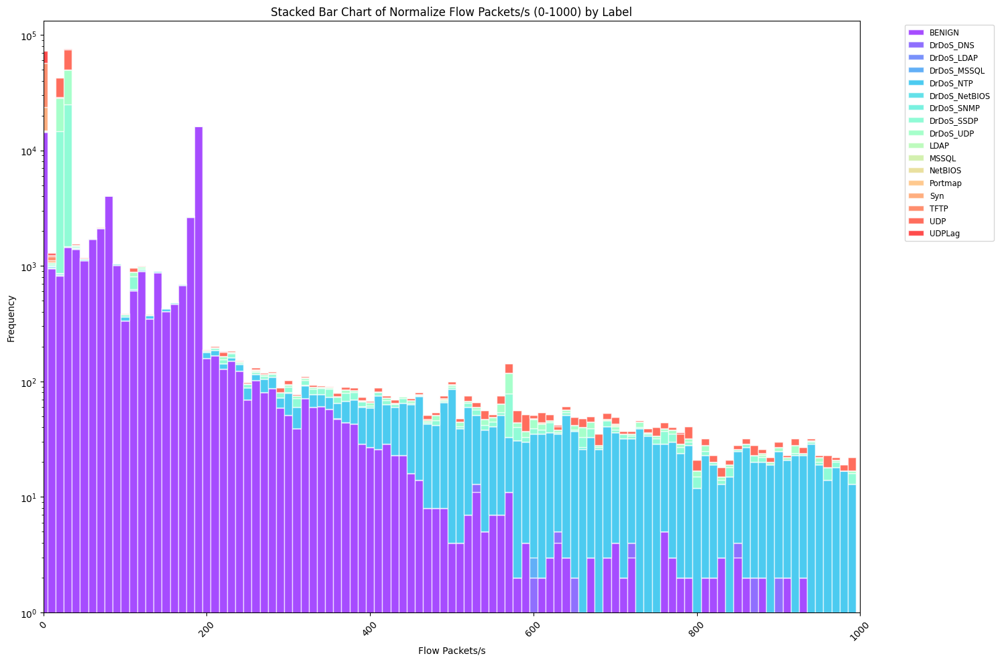

BENIGN: 54476 samples in 0-1000 range, full range: -1.0 - 3000000.0
DrDoS_DNS: 23 samples in 0-1000 range, full range: -1.0 - 2000000.0
DrDoS_LDAP: 5 samples in 0-1000 range, full range: -1.0 - 2000000.0
DrDoS_MSSQL: 90 samples in 0-1000 range, full range: -1.0 - 2000000.0
DrDoS_NTP: 2603 samples in 0-1000 range, full range: -1.0 - 4000000.0
DrDoS_NetBIOS: 47 samples in 0-1000 range, full range: -1.0 - 2000000.0
DrDoS_SNMP: 37 samples in 0-1000 range, full range: -1.0 - 2000000.0
DrDoS_SSDP: 38073 samples in 0-1000 range, full range: -1.0 - 3000000.0
DrDoS_UDP: 39339 samples in 0-1000 range, full range: -1.0 - 2000000.0
LDAP: 7 samples in 0-1000 range, full range: -1.0 - 2000000.0
MSSQL: 58 samples in 0-1000 range, full range: -1.0 - 2000000.0
NetBIOS: 113 samples in 0-1000 range, full range: -1.0 - 2000000.0
Portmap: 34 samples in 0-1000 range, full range: -1.0 - 2000000.0
Syn: 8934 samples in 0-1000 range, full range: -1.0 - 2000000.0
TFTP: 33506 samples in 0-1000 range, full range: 

In [103]:
import matplotlib.pyplot as plt
import numpy as np

# Characteristics and chart settings
caracteris = 'Flow Packets/s'
plt.rcParams["figure.figsize"] = (15, 10)
lim = 1000  # Set limit to 1000 as requested
bins = 100  # Increased number of bins for finer granularity

# Define labels and colors
labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]

colors = plt.cm.rainbow(np.linspace(0, 1, len(labels)))

# Prepare the figure and axis
fig, ax = plt.subplots()

# Define bin edges
bin_edges = np.linspace(0, lim, bins + 1)

# Initialize the bottom of the stacked bars to zero
bottom = np.zeros(bins)

# Plot each label's data as a stacked bar
for label, color in zip(labels, colors):
    data = dataset[dataset['Label'] == label][caracteris]
    data = data[(data >= 0) & (data <= lim)]  # Filter data within the 0-1000 range
    if not data.empty:
        # Compute histogram for the label
        counts, _ = np.histogram(data, bins=bin_edges)
        # Add stacked bar chart for this label
        ax.bar(bin_edges[:-1], counts, width=np.diff(bin_edges)[0], bottom=bottom, 
               color=color, alpha=0.7, edgecolor='white', label=label)
        # Update the bottom for stacking
        bottom += counts

# Set axis labels and title
ax.set_xlim([0, lim])
ax.set_xlabel(caracteris)
ax.set_ylabel('Frequency')
ax.set_title(f'Stacked Bar Chart of Normalize {caracteris} (0-1000) by Label')

# Use logarithmic scale for y-axis to better visualize differences
ax.set_yscale('log')

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Add a legend outside the plot for clarity
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')

# Adjust layout for better fit
plt.tight_layout()

# Show the plot
plt.show()

# Print information about the data for each label within the 0-1000 range
for label in labels:
    data = dataset[dataset['Label'] == label][caracteris]
    filtered_data = data[(data >= 0) & (data <= lim)]
    print(f"{label}: {len(filtered_data)} samples in 0-1000 range, full range: {data.min()} - {data.max()}")

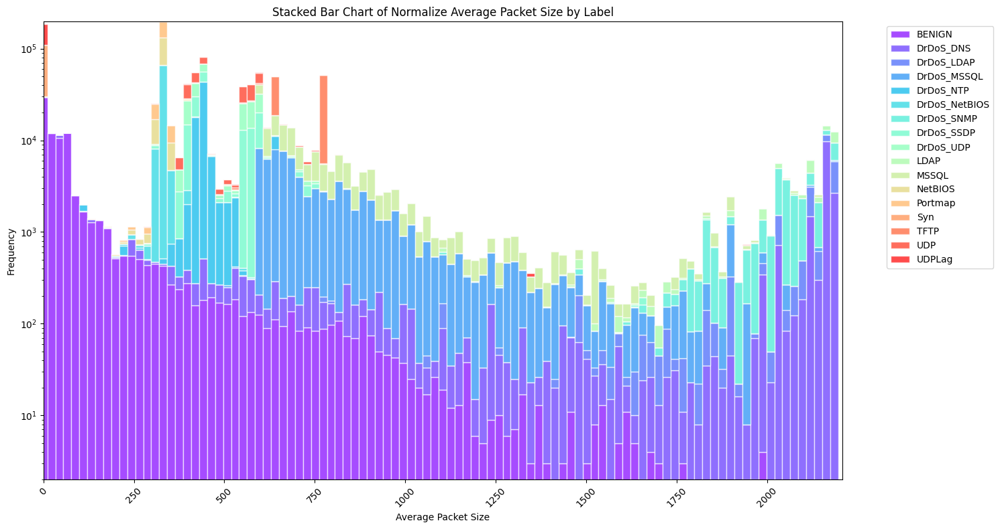

BENIGN: 79775 samples, range: 0.0 - 3660.0135869565215
DrDoS_DNS: 79460 samples, range: 0.0 - 2208.0
DrDoS_LDAP: 79834 samples, range: 0.0 - 2208.0
DrDoS_MSSQL: 79697 samples, range: 0.0 - 2208.0
DrDoS_NTP: 79602 samples, range: 0.0 - 2136.0
DrDoS_NetBIOS: 79548 samples, range: 0.0 - 2208.0
DrDoS_SNMP: 79830 samples, range: 0.0 - 2208.0
DrDoS_SSDP: 79755 samples, range: 0.0 - 2208.0
DrDoS_UDP: 79773 samples, range: 0.0 - 2208.0
LDAP: 79828 samples, range: 0.0 - 2208.0
MSSQL: 79498 samples, range: 0.0 - 2208.0
NetBIOS: 79678 samples, range: 7.0 - 883.5
Portmap: 79463 samples, range: 0.0 - 1500.0
Syn: 79734 samples, range: 0.0 - 835.5
TFTP: 79732 samples, range: 0.0 - 2208.0
UDP: 79745 samples, range: 7.0 - 961.5
UDPLag: 79601 samples, range: 0.0 - 2208.0


In [104]:
import matplotlib.pyplot as plt
import numpy as np

# Characteristics and chart settings
caracteris = 'Average Packet Size'
plt.rcParams["figure.figsize"] = (15, 8)
lim = 2208  # Data limit for visualization
bins = 100  # Increased number of bins for finer granularity

# Define labels and colors
labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]

colors = plt.cm.rainbow(np.linspace(0, 1, len(labels)))

# Prepare the figure and axis
fig, ax = plt.subplots()

# Define bin edges
bin_edges = np.linspace(0, lim, bins + 1)

# Initialize the bottom of the stacked bars to zero
bottom = np.zeros(bins)

# Plot each label's data as a stacked bar
for label, color in zip(labels, colors):
    data = dataset[dataset['Label'] == label][caracteris]
    data = data[data < lim]  # Apply limit to data
    if not data.empty:
        # Compute histogram for the label
        counts, _ = np.histogram(data, bins=bin_edges)
        # Add stacked bar chart for this label with uniform width
        ax.bar(bin_edges[:-1], counts, width=np.diff(bin_edges)[0], bottom=bottom, color=color, alpha=0.7, edgecolor='white', label=label)
        # Update the bottom for stacking
        bottom += counts

# Set axis labels and title
ax.set_xlim([0, lim])
ax.set_xlabel(caracteris)
ax.set_ylabel('Frequency')
ax.set_title(f'Stacked Bar Chart of Normalize {caracteris} by Label')

# Use logarithmic scale for better visibility of small differences
ax.set_yscale('log')

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Add a legend outside the plot for clarity
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout for better fit
plt.tight_layout()

# Show the plot
plt.show()

# Print information about the data for each label
for label in labels:
    data = dataset[dataset['Label'] == label][caracteris]
    print(f"{label}: {len(data)} samples, range: {data.min()} - {data.max()}")



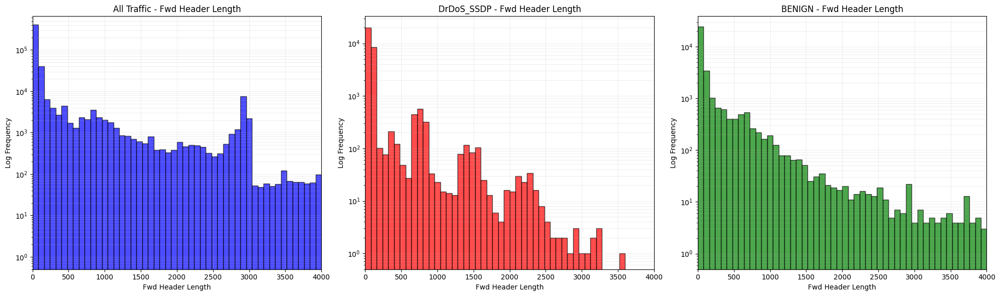

Total samples: 578806
DrDoS_SSDP samples: 34046
BENIGN samples: 33953

Types of traffic in the dataset:
Label
Portmap          34365
DrDoS_DNS        34362
MSSQL            34330
DrDoS_NetBIOS    34280
UDPLag           34227
NetBIOS          34150
DrDoS_MSSQL      34131
TFTP             34096
Syn              34094
UDP              34081
DrDoS_SSDP       34046
DrDoS_UDP        34034
DrDoS_SNMP       33997
LDAP             33992
DrDoS_LDAP       33990
BENIGN           33953
DrDoS_NTP        32678
Name: count, dtype: int64


In [105]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

caracteris = 'Fwd Header Length'
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 6))
lim = 4000

pruebadf = dataset1[dataset1[caracteris] < lim]
DrDoS_SSDP_df = pruebadf[pruebadf['Label'] == 'DrDoS_SSDP']
Benigndf = pruebadf[pruebadf['Label'] == "BENIGN"]

bin = 50

# Función para crear histograma
def plot_histogram(ax, data, title, color):
    counts, bins, _ = ax.hist(data, bins=bin, range=(0, lim), color=color, edgecolor='black', alpha=0.7)
    ax.set_title(title)
    ax.set_xlim([0, lim])
    ax.set_xlabel(caracteris)
    ax.set_ylabel('Log Frequency')
    ax.set_yscale('log')
    ax.grid(True, which="both", ls="-", alpha=0.2)
    # Añadir valor 1 a las barras vacías para que aparezcan en la escala logarítmica
    counts[counts == 0] = 1
    ax.set_ylim(bottom=0.5)  # Ajustar el límite inferior para mostrar las barras con valor 1

# Histograma para todo el tráfico
plot_histogram(ax[0], pruebadf[caracteris], f'All Traffic - {caracteris}', 'blue')

# Histograma para DrDoS_SSDP (aunque esté vacío)
plot_histogram(ax[1], DrDoS_SSDP_df[caracteris], f'DrDoS_SSDP - {caracteris}', 'red')

# Histograma para tráfico BENIGN
plot_histogram(ax[2], Benigndf[caracteris], f'BENIGN - {caracteris}', 'green')

plt.tight_layout()
plt.show()

# Imprimir estadísticas
print(f"Total samples: {len(pruebadf)}")
print(f"DrDoS_SSDP samples: {len(DrDoS_SSDP_df)}")
print(f"BENIGN samples: {len(Benigndf)}")

# Mostrar tipos de tráfico presentes
print("\nTypes of traffic in the dataset:")
traffic_types = pruebadf['Label'].value_counts()
print(traffic_types)

In [106]:
#print(shap_values.shape)
#print(explainer.expected_value)
#print(len(features))
#print(len(Labels))

import numpy as np

shap.initjs()

# Selecciona una clase específica para visualizar (por ejemplo, la primera clase)
class_index = 0

# Extrae los valores SHAP para la clase seleccionada
shap_values_class = shap_values[:, :, class_index]

# Asegúrate de que data1 sea un array de numpy si no lo es ya
data1_np = np.array(data1)

# Crea el force plot
shap.plots.force(
    base_value=explainer.expected_value[class_index],
    shap_values=shap_values_class,
    features=data1_np,
    feature_names=features,
    out_names=Labels[class_index]  # Usa solo el nombre de la clase seleccionada
)


In [107]:
model.eval()
with torch.no_grad():
    y_preddata = model(torch.tensor(data1, dtype=torch.float32)).numpy()


In [108]:
num=25;
# Selecciona una clase específica para visualizar (por ejemplo, la primera clase)
class_index = 0

# Extrae los valores SHAP para la clase seleccionada
shap_values_class = shap_values[:, :, class_index]

# Asegúrate de que data1 sea un array de numpy si no lo es ya
data1_np = np.array(data1)

# Crea el force plot
shap.plots.force(
    base_value=explainer.expected_value[class_index],
    shap_values=shap_values_class[num,:],
    features=data1_np[num,:],
    feature_names=features,
    out_names=Labels[class_index]  # Usa solo el nombre de la clase seleccionada
)

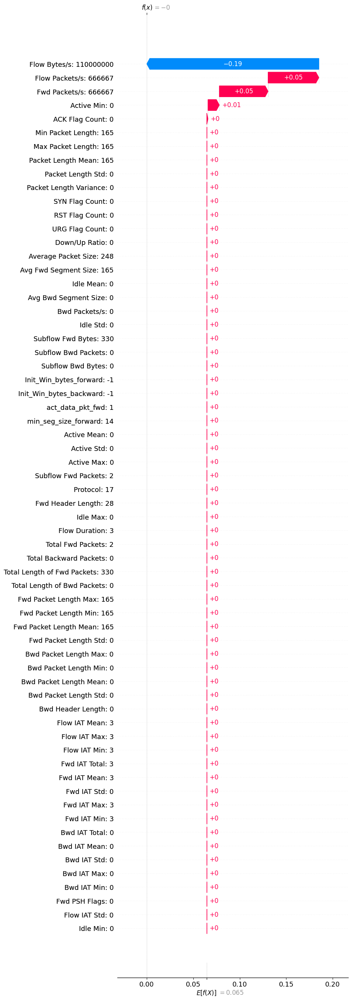

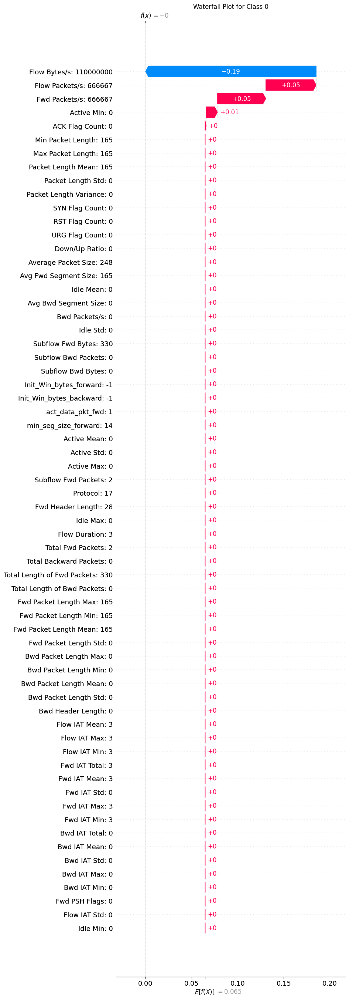

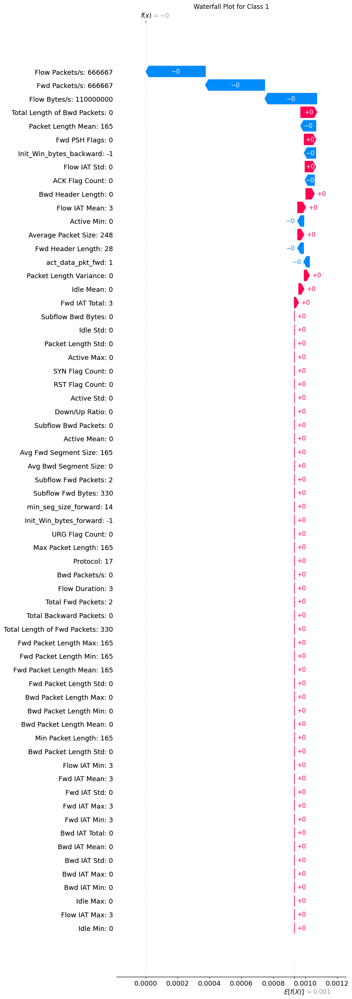

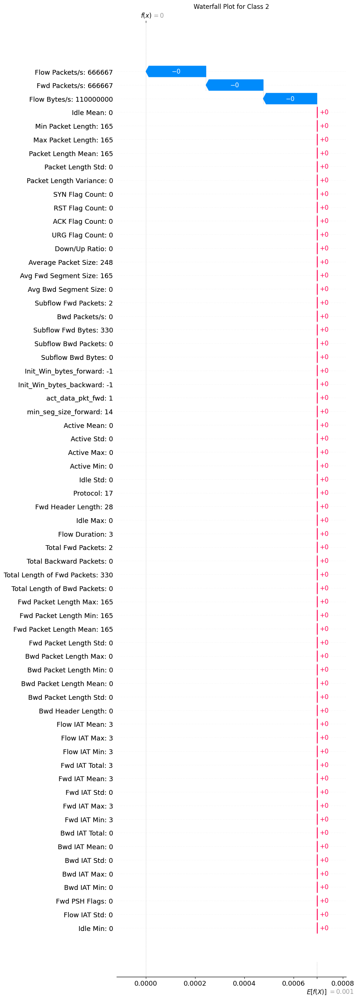

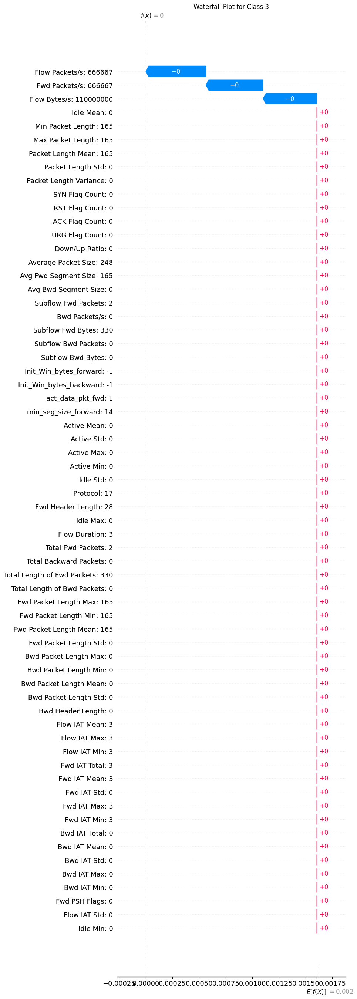

...

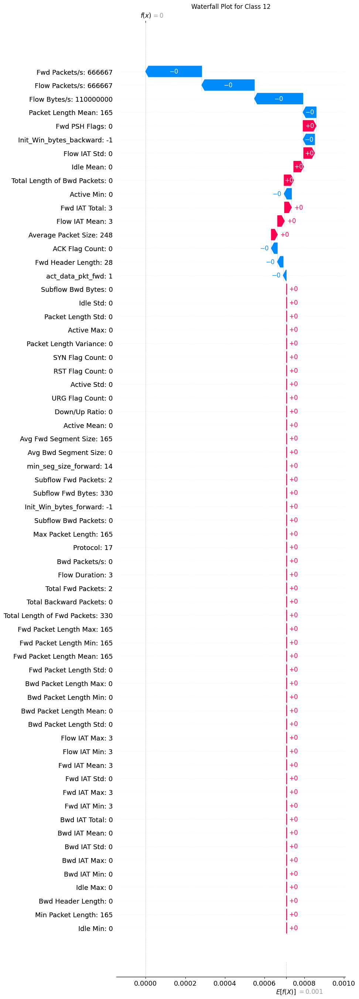

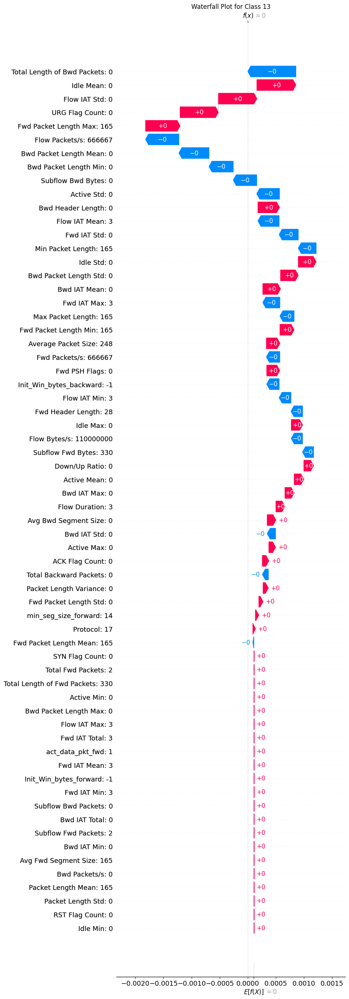

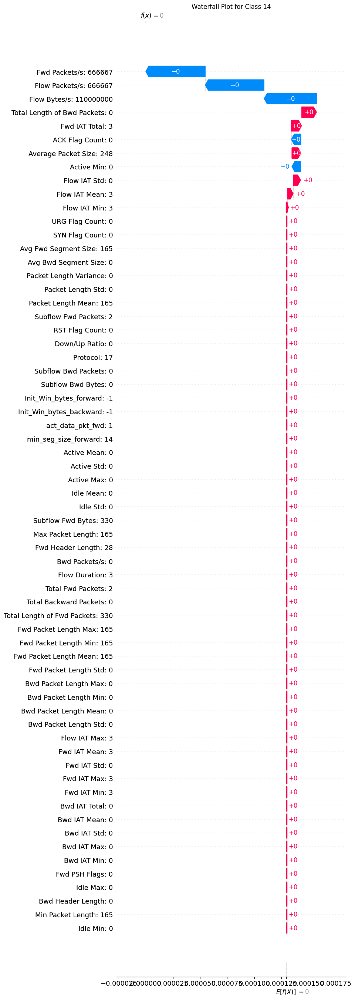

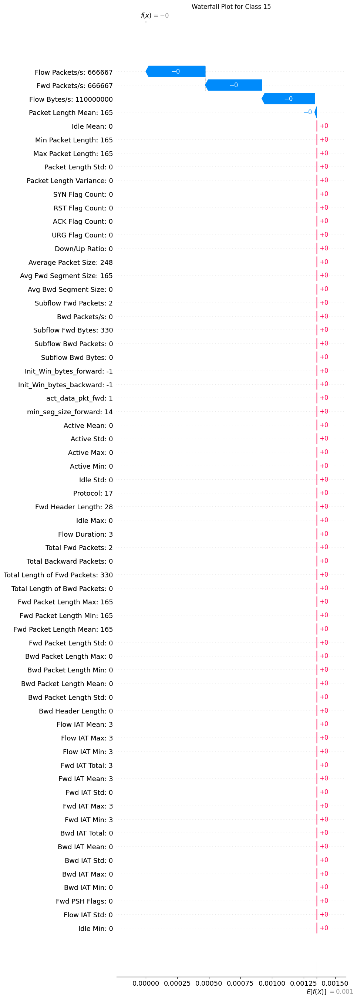

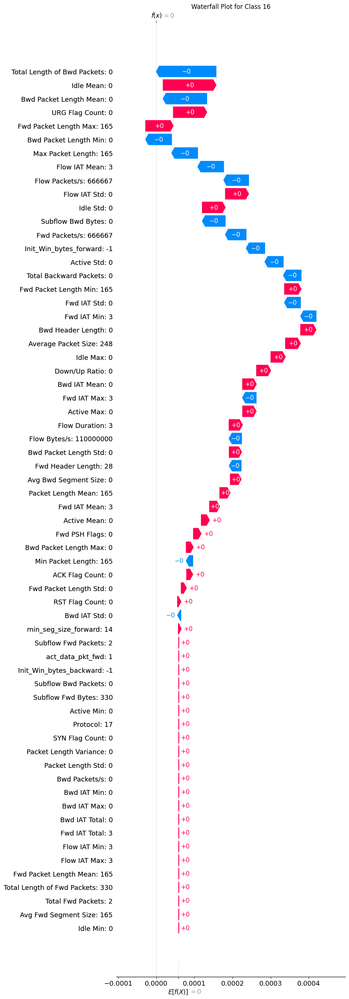

In [109]:
# Selecciona una clase específica para visualizar (por ejemplo, la primera clase)
class_index = 0

# Crea la lista de características con sus valores
feature = [f"{a}: {int(b)}" for a, b in zip(features, data1[num].round(0))]

# Usa el expected_value correspondiente a la clase seleccionada
expected_value_class = explainer.expected_value[class_index]

# Selecciona los valores SHAP para la muestra 'num' y la clase seleccionada
shap_values_class = shap_values[num, :, class_index]

# Crea el gráfico de cascada
shap.plots._waterfall.waterfall_legacy(
    expected_value_class,
    shap_values_class,
    feature_names=feature,
    max_display=80
)

for class_index in range(shap_values.shape[2]):
    plt.figure(figsize=(12, 8))
    plt.title(f"Waterfall Plot for Class {class_index}")
    expected_value_class = explainer.expected_value[class_index]
    shap_values_class = shap_values[num, :, class_index]
    
    shap.plots._waterfall.waterfall_legacy(
        expected_value_class,
        shap_values_class,
        feature_names=feature,
        max_display=80
    )
    
    #plt.tight_layout()
    #plt.show()

In [110]:
#REVISAR
nuevo_shap = np.zeros_like(shap_values[0])
nuevo_data = np.zeros_like(data1[0])
nuevo_min = data1[0].copy()
nuevo_max = np.zeros_like(data1[0])
nuevo_std = np.zeros_like(data1[0])
acum = 0
ata = 2
margen = 0.2

for i in range(size):
    suma = np.sum(shap_values[i]) + np.sum(explainer.expected_value)
    if (ata - abs(margen)) < suma < (ata + abs(margen)):
        nuevo_shap += shap_values[i]
        nuevo_data += data1[i]
        nuevo_min = np.minimum(nuevo_min, data1[i])
        nuevo_max = np.maximum(nuevo_max, data1[i])
        acum += 1

if acum > 0:
    nuevo_shap /= acum
    nuevo_data /= acum

    # Cálculo del STD
    nuevo_std = np.zeros_like(data1[0])
    for i in range(size):
        suma = np.sum(shap_values[i]) + np.sum(explainer.expected_value)
        if (ata - abs(margen)) < suma < (ata + abs(margen)):
            nuevo_std += (data1[i] - nuevo_data) ** 2
    
    nuevo_std = np.sqrt(nuevo_std / acum)

    feature = [f"{a}\n {int(b)} {int(c)} {int(d)} {int(e)}"
               for a, b, c, d, e in zip(features, nuevo_min, nuevo_data, nuevo_std, nuevo_max)]

    print(Labels[ata])
    shap.plots._waterfall.waterfall_legacy(np.sum(explainer.expected_value), nuevo_shap, feature_names=feature, max_display=11)
else:
    print(f"No se encontraron muestras para la clase {Labels[ata]} dentro del margen especificado.")
    print(f"Valor objetivo: {ata}")
    print(f"Margen: {margen}")
    print(f"Rango de suma aceptado: {ata - abs(margen)} a {ata + abs(margen)}")

No se encontraron muestras para la clase DrDoS_SNMP dentro del margen especificado.
Valor objetivo: 2
Margen: 0.2
Rango de suma aceptado: 1.8 a 2.2


#### DECISION TREE

In [111]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Supongamos que X_train, X_test, Y_train, Y_test ya están definidos
X_trainArr = X_train.to_numpy() if not isinstance(X_train, np.ndarray) else X_train
X_testArr = X_test.to_numpy() if not isinstance(X_test, np.ndarray) else X_test

# Convertir etiquetas de texto a enteros
label_encoder = LabelEncoder()
Y_trainArr = label_encoder.fit_transform(Y_train)

LabelsArr = label_encoder.classes_

# Ajustar Y_trainArr si es necesario para que coincida con X_trainArr
Y_trainArr = Y_trainArr[:len(X_trainArr)]
assert len(X_trainArr) == len(Y_trainArr), "X_trainArr y Y_trainArr deben tener el mismo número de muestras."

# Entrenamiento del modelo con RandomForestClassifier optimizado
clf = RandomForestClassifier(
    random_state=0,
    n_estimators=200,  # Aumenta el número de árboles
    max_depth=None,  # Permitir una mayor profundidad
    min_samples_split=2,  # Permitir divisiones más pequeñas
    min_samples_leaf=1,  # Permitir hojas más pequeñas
    class_weight='balanced_subsample'  # Balancear las clases usando el subconjunto
)
clf.fit(X_trainArr, Y_trainArr)

# Validación cruzada
cv_scores = cross_val_score(clf, X_trainArr, Y_trainArr, cv=5)
print(f"Cross-validation scores: {cv_scores}")

# Predicción sobre los datos de prueba
y_testree1 = Y_test  # Etiquetas reales del conjunto de prueba
y_predtree1 = clf.predict(X_testArr)  # Predicción usando el modelo entrenado

# Generar y mostrar el reporte de clasificación
print(classification_report(y_testree1, y_predtree1, digits=8, zero_division="warn"))

# Mostrar la precisión del modelo
accuracy_modelo = accuracy_score(y_testree1, y_predtree1)
print(f"Precisión del modelo: {accuracy_modelo}")


KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Asumimos que 'dataset' es tu DataFrame con los datos
# Si no está definido, necesitarás cargar tus datos primero

# Definir las 5 características más destacables y sus límites
top_features = [
    'Bwd Packets/s',
    'Total Length of Fwd Packets',
    'Packet Length Variance',
    'Fwd Packet Length Mean',
    'Bwd Packet Length Min'
]
limits = [0.119, 5000.0, 0.107, 1191.5, 471.5]

# Definir los labels y colores
labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]
colors = plt.cm.get_cmap('tab20', len(labels))

# Crear la figura
plt.figure(figsize=(25, 35))

# Dibujar los histogramas normalizados para cada característica
for i, (feature, limit) in enumerate(zip(top_features, limits), 1):
    plt.subplot(5, 1, i)
    
    for label in labels:
        data = dataset[dataset['Label'] == label][feature]
        data = data[data <= limit]  # Aplicar el límite
        if not data.empty:
            plt.hist(data, bins=50, range=(0, limit), density=True, alpha=0.6, 
                     label=label, color=colors(labels.index(label)), edgecolor='black')
    
    plt.xlabel(feature, fontsize=12)
    plt.ylabel('Proporción', fontsize=12)
    plt.title(f'Distribución de {feature} por Etiqueta', fontsize=14)
    plt.xlim(0, limit)
    plt.grid(True, alpha=0.3, linestyle='--')
    
    if i == 1:  # Solo añadir leyenda al primer subgráfico
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Ajustar el diseño para que la leyenda no corte
plt.tight_layout(rect=[0, 0, 0.85, 1])

# Añadir una leyenda central
handles, _ = plt.gca().get_legend_handles_labels()
fig = plt.gcf()
fig.legend(handles, labels, loc='upper right', fontsize=10)

# Mostrar el gráfico
plt.show()

# Imprimir información sobre los datos
print("\nInformación sobre los datos:")
for feature, limit in zip(top_features, limits):
    print(f"\nCaracterística: {feature}")
    for label in labels:
        data = dataset[dataset['Label'] == label][feature]
        data = data[data <= limit]
        if not data.empty:
            print(f"{label}: {len(data)} muestras, rango: {data.min():.4f} - {data.max():.4f}")
        else:
            print(f"{label}: 0 muestras")